# Loop design and disulfide search

### Boilerplate

In [1]:
%load_ext lab_black
# python internal
import collections
import copy
import gc
from glob import glob
import h5py
import itertools
import os
import random
import re
import socket
import shutil
import subprocess
import sys

# conda/pip
import dask
import graphviz
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy
import seaborn as sns
from tqdm import tqdm

# special packages on the DIGS
import py3Dmol
import pymol
import pyrosetta

# notebook magic
%matplotlib inline
%load_ext autoreload
%autoreload 2

print(os.getcwd())
print(socket.gethostname())

/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders
dig163


### Original approach for loop design and stapling docked helix binders
5. Design the loops (incl. neighborhood):  
`/home/flop/switch/5thround/DHRs/loops/des*`
6. After cleaning up loop neighborhoods with fragment constrained design, stapled using the scripts here:  
`/home/flop/scripts/disulfides/`  
I'll scale up the approach and collect additional metadata using `PyRosetta.distributed`  
I will rule out designs by packing the loop, then stapling. The staples need to be scored to meet reasonable metrics -  
Adam Moyer suggested `dslf_fa13` of `-0.8` after cartesian relax and minimization. Probably checking RMSD after this minimization is a good idea too.  
For matching, will try to always find matches for State X as the initial, parent DHR, as this is the gold standard for a reference state. 

### Make functions for loop design and disulfide stapling

In [2]:
from pyrosetta.distributed.packed_pose.core import PackedPose
from pyrosetta.distributed import requires_init
from typing import *


@requires_init
def pack(packed_pose_in=None, **kwargs) -> Generator[str, PackedPose, None]:
    """
    Quickly pack rotamers in new loop with native-like sequence constraints.
    We will allow TRP here because it is in an interesting region for NMR.
    """
    import bz2
    import pyrosetta
    import pyrosetta.distributed.io as io
    from pyrosetta.distributed.tasks.rosetta_scripts import (
        SingleoutputRosettaScriptsTask,
    )

    if packed_pose_in == None:
        file = kwargs["-s"]
        with open(file, "rb") as f:
            packed_pose_in = io.pose_from_pdbstring(bz2.decompress(f.read()).decode())
        scores = pyrosetta.distributed.cluster.get_scores_dict(file)["scores"]
    else:
        scores = packed_pose_in.pose.scores
    new_loop_resis = scores["new_loop_resis"]
    xml = """
    <ROSETTASCRIPTS>
        <SCOREFXNS>
            <ScoreFunction name="sfxn" weights="beta_nov16" >
                <Reweight scoretype="res_type_constraint" weight="1.0" />
            </ScoreFunction> 
        </SCOREFXNS>
        <RESIDUE_SELECTORS>
            <Index name="new_loop_resis" resnums="{new_loop_resis}" />
            <Neighborhood name="around_new_loop" selector="new_loop_resis" distance="6.0" />
            <Or name="designable" selectors="new_loop_resis,around_new_loop" />
            <Neighborhood name="packable" selector="designable" distance="6.0"/>
            <Not name="not_designable" selector="designable" />
            <Not name="not_packable" selector="packable" />
            <ResidueName name="pro_and_gly_positions" residue_name3="PRO,GLY" />
            <Layer name="surface" select_core="false" select_boundary="false" select_surface="true"
                use_sidechain_neighbors="true"/>
            <Layer name="boundary" select_core="false" select_boundary="true" select_surface="false" 
                use_sidechain_neighbors="true"/>
            <Layer name="core" select_core="true" select_boundary="false" select_surface="false" 
                use_sidechain_neighbors="true"/>
            <SecondaryStructure name="sheet" overlap="0" minH="3" minE="2" include_terminal_loops="false" 
                use_dssp="true" ss="E"/>
            <SecondaryStructure name="entire_loop" overlap="0" minH="3" minE="2" include_terminal_loops="true" 
                use_dssp="true" ss="L"/>
            <SecondaryStructure name="entire_helix" overlap="0" minH="3" minE="2" include_terminal_loops="false"
                use_dssp="true" ss="H"/>
            <And name="helix_cap" selectors="entire_loop">
                <PrimarySequenceNeighborhood lower="1" upper="0" selector="entire_helix"/>
            </And>
            <And name="helix_start" selectors="entire_helix">
                <PrimarySequenceNeighborhood lower="0" upper="1" selector="helix_cap"/>
            </And>
            <And name="helix" selectors="entire_helix">
                <Not selector="helix_start"/>
            </And>
            <And name="loop" selectors="entire_loop">
                <Not selector="helix_cap"/>
            </And>
        </RESIDUE_SELECTORS>
        <TASKOPERATIONS>
            <RestrictAbsentCanonicalAAS name="design" keep_aas="ADEFGHIKLMNPQRSTVWY" />
            <OperateOnResidueSubset name="pack" selector="not_designable">
                <RestrictToRepackingRLT/>
            </OperateOnResidueSubset>
            <OperateOnResidueSubset name="lock" selector="not_packable">
                <PreventRepackingRLT/>
            </OperateOnResidueSubset>
            <DesignRestrictions name="layer_design">
                <Action selector_logic="surface AND helix_start"  aas="DEHKPQR"/>
                <Action selector_logic="surface AND helix"        aas="EHKQR"/>
                <Action selector_logic="surface AND sheet"        aas="EHKNQRST"/>
                <Action selector_logic="surface AND loop"         aas="DEGHKNPQRST"/>
                <Action selector_logic="boundary AND helix_start" aas="ADEHIKLNPQRSTVWY"/>
                <Action selector_logic="boundary AND helix"       aas="ADEHIKLNQRSTVWYM"/>
                <Action selector_logic="boundary AND sheet"       aas="DEFHIKLNQRSTVWY"/>
                <Action selector_logic="boundary AND loop"        aas="ADEFGHIKLNPQRSTVWY"/>
                <Action selector_logic="core AND helix_start"     aas="AFILVWYNQSTHP"/>
                <Action selector_logic="core AND helix"           aas="AFILVWM"/>
                <Action selector_logic="core AND sheet"           aas="FILVWY"/>
                <Action selector_logic="core AND loop"            aas="AFGILPVWYSM"/>
                <Action selector_logic="helix_cap"                aas="DNSTP"/>
            </DesignRestrictions>
            <PruneBuriedUnsats name="prune" allow_even_trades="false" 
                atomic_depth_cutoff="3.5" minimum_hbond_energy="-1.0"/>
            <LimitAromaChi2 name="arochi" chi2max="110" chi2min="70" include_trp="True" />
            <ExtraRotamersGeneric name="ex1_ex2" ex1="1" ex2="1" />
        </TASKOPERATIONS>
        <MOVERS>
            <StructProfileMover name="gen_profile" add_csts_to_pose="1" consider_topN_frags="100" 
                eliminate_background="0" ignore_terminal_residue="1" only_loops="0"
                residue_selector="designable" burialWt="0" RMSthreshold="0.6" />
            <ClearConstraintsMover name="clear_constraints" />
            <PackRotamersMover name="pack"
            task_operations="arochi,prune,ex1_ex2,design,pack,lock,layer_design"/>
        </MOVERS>
        <PROTOCOLS>
            <Add mover="gen_profile"/>
            <Add mover="pack"/>
            <Add mover="clear_constraints"/>
        </PROTOCOLS>
    </ROSETTASCRIPTS>
    """.format(
        new_loop_resis=new_loop_resis
    )
    pack = SingleoutputRosettaScriptsTask(xml)
    pack_ppose = pack(packed_pose_in.pose.clone())
    pose = io.to_pose(pack_ppose)
    for key, value in scores.items():
        pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, key, value)
    final_ppose = io.to_packed(pose)
    yield final_ppose


def staple(packed_pose_in: PackedPose, **kwargs) -> set:
    """
    Try find a native disulfide connection.
    Do increasingly larger normal modes perturbation each time it can't find one.
    Start at 3 normal modes and increase up to 12. Perturbation scale is 1.6.
    """
    import pyrosetta
    import pyrosetta.distributed.io as io
    from pyrosetta.distributed.tasks.rosetta_scripts import (
        SingleoutputRosettaScriptsTask,
    )
    from pyrosetta.rosetta.protocols.rosetta_scripts import XmlObjects
    from stapler import NativeDisulfideStapler

    def unsafely_sanitize_ppose(ppose: PackedPose):
        """
        Add a tiny amount of random noise to the xyz coordinates of a pose, lowering
        (but not mathematically eliminating) the possibility of colinear atoms
        (which probably shouldn't be there in the first place)
        Unsafe because there shouldn't be colinear atoms, but moreso because it uses numpy
        to generate the random noise, not rosetta's internal seed
        @rdkibler @pleung
        """
        import numpy as np
        import pyrosetta.distributed.io as io

        def vector1_numeric_xyzVector_double_t__to__numpy_arr(ros_vec):
            return np.array([xyz for xyz in ros_vec])

        def numpy_arr__to__vector1_numeric_xyzVector_double_t(np_arr):
            coords = pyrosetta.rosetta.utility.vector1_numeric_xyzVector_double_t()
            for xyz in np_arr:
                x, y, z = xyz
                coords.append(
                    pyrosetta.rosetta.numeric.xyzVector_double_t(x_a=x, y_a=y, z_a=z)
                )
            return coords

        def get_ids_and_coords(pose):
            ids = pyrosetta.rosetta.utility.vector1_core_id_AtomID()
            for i, res in enumerate(pose.residues):
                ros_i = i + 1
                for j in range(1, res.natoms() + 1):
                    ids.append(pyrosetta.AtomID(j, ros_i))
            coords = pyrosetta.rosetta.utility.vector1_numeric_xyzVector_double_t()
            pose.batch_get_xyz(ids, coords)
            coords = vector1_numeric_xyzVector_double_t__to__numpy_arr(coords)
            return ids, coords

        def set_coords(pose, ids, coords):
            coords = numpy_arr__to__vector1_numeric_xyzVector_double_t(coords)
            pose.batch_set_xyz(ids, coords)

        pose = io.to_pose(ppose)

        ids, coords = get_ids_and_coords(pose)

        offset = np.random.randint(-9, 9, size=(len(coords), 3))

        coords += offset / 1000

        set_coords(pose, ids, coords)

        ppose = io.to_packed(pose)

        return ppose

    scores = packed_pose_in.pose.scores
    packed_pose_in = unsafely_sanitize_ppose(packed_pose_in)
    initial_pose = io.to_pose(packed_pose_in)
    for key, value in scores.items():
        pyrosetta.rosetta.core.pose.setPoseExtraScore(initial_pose, key, value)
    packed_pose_in = io.to_packed(initial_pose)
    pose = io.to_pose(packed_pose_in.pose.clone())
    original = pose.clone()
    new_loop_resis = [int(x) for x in scores["new_loop_resis"].split(",")]
    new_loop_resis.sort()
    print("new loop found at indices", new_loop_resis)
    upper_A = new_loop_resis[0] - 4
    lower_B = new_loop_resis[-1] + 4
    try:
        assert upper_A > 0
        assert lower_B < len(pose.residues)
    except AssertionError:
        print("the new loop resis are unexpectedly close to the termini")
    selectors = XmlObjects.create_from_string(
        """
        <RESIDUE_SELECTORS>
            <SSElement name="first" selection="n_term" to_selection="{pre},H,E" chain="A" reassign_short_terminal_loop="2" />
            <SSElement name="second" selection="{post},H,S" to_selection="c_term" chain="A" reassign_short_terminal_loop="2" />
        </RESIDUE_SELECTORS>
        """.format(
            pre=int(scores["pre_break_helix"]),
            post=int(int(scores["pre_break_helix"]) + 1),
        )
    )
    first = selectors.get_residue_selector("first")
    second = selectors.get_residue_selector("second")
    first_resis = list(first.apply(pose))
    second_resis = list(second.apply(pose))
    chunk_A = pyrosetta.rosetta.core.select.residue_selector.ResidueIndexSelector()
    chunk_B = pyrosetta.rosetta.core.select.residue_selector.ResidueIndexSelector()
    offset = 3  # distance we want to stay away from new loop
    length = len(pose.residues)
    assert length == int(scores["total_length"])
    A_to_append = [i for i, bool_ in enumerate(first_resis, start=1) if bool_]
    A_to_append = A_to_append[:-offset]
    for i in A_to_append:
        chunk_A.append_index(i)
    B_to_append = [i for i, bool_ in enumerate(second_resis, start=1) if bool_]
    B_to_append = B_to_append[offset:]
    for i in B_to_append:
        chunk_B.append_index(i)
    not_too_close = [chunk_B, chunk_A]
    # reset new loop resis
    new_loop_resis = scores["new_loop_resis"]
    # initialize the native disulfide stapler with defaults.
    stapler = NativeDisulfideStapler(
        residue_selectors=not_too_close,
    )
    peek = None
    i = 0
    for i in range(5):
        crosslinked_poses = stapler.apply(pose)  # this returns a generator
        try:  # peek inside the generator to see if it is empty
            peek = next(crosslinked_poses)  # raises StopIteration exception if empty
            break  # break out of the loop if it isn't empty
        except StopIteration:  # perform normal modes relax if StopIteration exception occurs
            xml = """
            <ROSETTASCRIPTS>
                <SCOREFXNS>
                <ScoreFunction name="sfxn" weights="beta_nov16_cart"/>
                <ScoreFunction name="sfxn_bb_perturb" weights="beta_nov16_cart">
                    <Reweight scoretype="coordinate_constraint" weight="5.0"/> #play with this
                </ScoreFunction>
                </SCOREFXNS>
                <RESIDUE_SELECTORS>
                    <True name="all"/>
                    <SSElement name="design" selection="{pre},H,S" to_selection="-{post},H,E" chain="A" reassign_short_terminal_loop="2" />            
                    <Not name="not_design" selector="design"/>
                    <Neighborhood name="pack" selector="design" distance="8.0" include_focus_in_subset="0"/>
                    <Not name="not_pack" selector="pack"/>
                    <And name="lock_selector" selectors="not_pack,not_design"/>
                </RESIDUE_SELECTORS>
                <TASKOPERATIONS>
                    <OperateOnResidueSubset name="lock" selector="lock_selector">
                        <PreventRepackingRLT/>
                    </OperateOnResidueSubset>
                </TASKOPERATIONS>
                <MOVERS>
                    <NormalModeRelax name="normal_modes"
                        cartesian="true"
                        centroid="false"
                        nmodes="{nmodes}"
                        scorefxn="sfxn_bb_perturb"
                        mix_modes="true"
                        pertscale="1.6"
                        randomselect="true"
                        relaxmode="relax"
                        cartesian_minimize="false" >
                        <MoveMap name="mm" bb="false" chi="false" jump="false" >
                            <ResidueSelector selector="all" bb="false" chi="false" />
                            <ResidueSelector selector="pack" bb="false" chi="true" />
                            <ResidueSelector selector="design" bb="true" chi="true" />
                        </MoveMap>
                    </NormalModeRelax>
                </MOVERS>
                <PROTOCOLS>
                    <Add mover="normal_modes"/>
                </PROTOCOLS>
            </ROSETTASCRIPTS>
            """.format(
                pre=int(int(scores["pre_break_helix"]) - 1),
                post=int(int(scores["pre_break_helix"]) - 1),
                nmodes=int(3 + i),  # increase number of normal modes each iteration
            )
            normal_modes = SingleoutputRosettaScriptsTask(xml)
            pose = io.to_pose(normal_modes(pose))
    nmodes_attempts = float(i)
    name = pose.pdb_info().name()
    poses = []
    sfxn = pyrosetta.rosetta.protocols.loops.get_fa_scorefxn()
    crosslinked_poses = [p for p in crosslinked_poses]
    # put back the peeked at pose if it exists
    if peek is not None:
        crosslinked_poses.insert(0, peek)
    else:
        pass
    i = 0
    for i, crosslinked_pose in enumerate(crosslinked_poses):
        suffix = "_" + str(i)
        crosslinked_pose.pdb_info().name(name + suffix)
        disulfide = []
        for j, aa in enumerate(crosslinked_pose.sequence(), start=1):
            if aa == "C":
                disulfide.append(str(j))
            else:
                pass
        assert len(disulfide) == 2
        disulfide_str = ",".join(disulfide)
        pyrosetta.rosetta.core.pose.setPoseExtraScore(
            crosslinked_pose, "disulfide_at", disulfide_str
        )
        pyrosetta.rosetta.core.pose.setPoseExtraScore(
            crosslinked_pose, "nmodes_attempts", nmodes_attempts
        )
        rmsd_calc = pyrosetta.rosetta.core.simple_metrics.metrics.RMSDMetric()
        rmsd_calc.set_rmsd_type(pyrosetta.rosetta.core.scoring.rmsd_atoms(3))
        rmsd_calc.set_run_superimpose(True)
        rmsd_calc.set_comparison_pose(original)
        rmsd = rmsd_calc.calculate(crosslinked_pose)
        pyrosetta.rosetta.core.pose.setPoseExtraScore(
            crosslinked_pose, "rmsd_nmp", rmsd
        )
        for key, value in scores.items():
            pyrosetta.rosetta.core.pose.setPoseExtraScore(crosslinked_pose, key, value)
        poses.append(crosslinked_pose)
    if len(poses) > 0:
        final_pposes = io.to_packed(set(poses))
    else:  # just return the original pose if it fails
        pose = io.to_pose(packed_pose_in.pose.clone())
        pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, "disulfide_at", "0,0")
        pyrosetta.rosetta.core.pose.setPoseExtraScore(
            pose, "nmodes_attempts", nmodes_attempts
        )
        pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, "rmsd_nmp", 0.0)
        final_pposes = io.to_packed({pose})
    return final_pposes


def check_disulf_energy(packed_pose_in: PackedPose, **kwargs) -> PackedPose:
    """
    relax the pose around the interface in cartesian space, but don't save it, keep the original pose,
    get the cartesian-relaxed disulfide scores and rmsd,
    and add them the original pose with the original scores
    Assumes middle is where the switch is split originally, enabling forward and backward SSElement selection approach
    @pleung
    """
    import pyrosetta
    import pyrosetta.distributed.io as io
    from pyrosetta.distributed.tasks.rosetta_scripts import (
        SingleoutputRosettaScriptsTask,
    )

    scores = packed_pose_in.pose.scores
    xml = """
    <ROSETTASCRIPTS>
        <SCOREFXNS>
            <ScoreFunction name="sfxn_cart" weights="ref2015_cart" /> 
            <ScoreFunction name="sfxn" weights="ref2015" /> 
        </SCOREFXNS>
        <RESIDUE_SELECTORS>
            <True name="all"/>
            <SSElement name="design" selection="{pre},H,S" to_selection="-{post},H,E" chain="A" reassign_short_terminal_loop="2" />            
            <Not name="not_design" selector="design"/>
            <Neighborhood name="pack" selector="design" distance="8.0" include_focus_in_subset="0"/>
            <Not name="not_pack" selector="pack"/>
            <And name="lock_selector" selectors="not_pack,not_design"/>
        </RESIDUE_SELECTORS>
        <TASKOPERATIONS>
            <PruneBuriedUnsats name="prune" allow_even_trades="false" 
                atomic_depth_cutoff="3.5" minimum_hbond_energy="-1.0"/>
            <LimitAromaChi2 name="arochi" chi2max="110" chi2min="70" include_trp="True" />
            <ExtraRotamersGeneric name="ex1_ex2" ex1="1" ex2="1" />
            <OperateOnResidueSubset name="lock" selector="lock_selector">
                <PreventRepackingRLT/>
            </OperateOnResidueSubset>
        </TASKOPERATIONS>
        <FILTERS>
            <Rmsd name="rmsd_cart" reference_name="before_relax" chains="AB" superimpose="1" threshold="5" by_aln="0" confidence="0" />
        </FILTERS>
        <MOVERS>
            <SavePoseMover name="save_before_relax" restore_pose="0" reference_name="before_relax"/>
            <FastRelax name="relax" scorefxn="sfxn_cart"
                task_operations="arochi,prune,ex1_ex2,lock"
                repeats="2" 
                relaxscript="MonomerRelax2019"
                cartesian="true"
                bondangle="true"
                bondlength="true" >
                    <MoveMap name="mm" bb="false" chi="false" jump="false" >
                        <ResidueSelector selector="all" bb="false" chi="false" bondangle="false" bondlength="false" />
                        <ResidueSelector selector="pack" bb="false" chi="true" bondangle="true" bondlength="true" />
                        <ResidueSelector selector="design" bb="true" chi="true" bondangle="true" bondlength="true" />
                    </MoveMap>
            </FastRelax>
        </MOVERS>
        <PROTOCOLS>
            <Add mover="save_before_relax" />
            <Add mover="relax" />            
            <Add filter="rmsd_cart" />            
        </PROTOCOLS>
        <OUTPUT scorefxn="sfxn" />
    </ROSETTASCRIPTS>
    """.format(
        pre=int(int(scores["pre_break_helix"]) - 1),
        post=int(int(scores["pre_break_helix"]) - 1),
    )
    relax = SingleoutputRosettaScriptsTask(xml)
    # relax the pose to get scores
    relax_ppose = relax(packed_pose_in.pose.clone())
    # keep the original pose...
    pose = io.to_pose(packed_pose_in)
    # ... get the cartesian-relaxed disulfide scores and rmsd...
    update = relax_ppose.pose.scores
    dslf_fa13_cart = update["dslf_fa13"]
    rmsd_cart = update["rmsd_cart"]
    # ... add the original scores ...
    for key, value in scores.items():
        pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, key, value)
    # ... and finally add the cartesian-relaxed disulfide scores and rmsd
    pyrosetta.rosetta.core.pose.setPoseExtraScore(
        pose, "dslf_fa13_cart", dslf_fa13_cart
    )
    pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, "rmsd_cart", rmsd_cart)
    final_ppose = io.to_packed(pose)
    return final_ppose


def relax(packed_pose_in: PackedPose, **kwargs) -> PackedPose:
    """
    Using dualspace relax, check rmsd and fragment quality and return scored packed pose
    geometry filter counts bad residues.
    Assumes middle is where the switch is split originally, enabling forward and backward SSElement selection approach
    @pleung
    """
    import pyrosetta
    import pyrosetta.distributed.io as io
    from pyrosetta.distributed.tasks.rosetta_scripts import (
        SingleoutputRosettaScriptsTask,
    )

    scores = packed_pose_in.pose.scores
    new_loop_resis = scores["new_loop_resis"]
    xml = """
    <ROSETTASCRIPTS>
        <SCOREFXNS>
            <ScoreFunction name="sfxn" weights="beta_nov16" /> 
            <ScoreFunction name="sfxn_cart" weights="beta_nov16_cart" /> 
        </SCOREFXNS>
        <RESIDUE_SELECTORS>
            <True name="all"/>
            <Chain name="chA" chains="A"/>
            <Chain name="chB" chains="B"/>
            <ResidueName name="CYS" residue_name3="CYS" />
            <Not name="not_CYS" selector="CYS" />
            <Index name="new_loop_resis" resnums="{new_loop_resis}" />
            <Neighborhood name="around_new_loop" selector="new_loop_resis" distance="8.0" />
            <SSElement name="design" selection="{pre},H,S" to_selection="-{post},H,E" chain="A" reassign_short_terminal_loop="2" />            
            <Not name="not_design" selector="design"/>
            <Neighborhood name="pack" selector="design" distance="8.0" include_focus_in_subset="0"/>
            <Not name="not_pack" selector="pack"/>
            <And name="lock_selector" selectors="not_pack,not_design"/>
        </RESIDUE_SELECTORS>
        <TASKOPERATIONS>
            <PruneBuriedUnsats name="prune" allow_even_trades="false" 
                atomic_depth_cutoff="3.5" minimum_hbond_energy="-1.0"/>
            <LimitAromaChi2 name="arochi" chi2max="110" chi2min="70" include_trp="True" />
            <ExtraRotamersGeneric name="ex1_ex2" ex1="1" ex2="1" />
            <OperateOnResidueSubset name="lock" selector="lock_selector">
                <PreventRepackingRLT/>
            </OperateOnResidueSubset>
        </TASKOPERATIONS>
        <FILTERS>
            <ContactMolecularSurface name="cmsa_int" target_selector="chA" binder_selector="chB" confidence="0" />
            <Sasa name="sasa_int" confidence="0" />
            <ShapeComplementarity name="sc_int" verbose="0" min_sc="0.55" write_int_area="1" write_median_dist="1" jump="1" confidence="0"/>
            <Geometry name="geometry"
            confidence="0"
            count_bad_residues="true" />
            <Geometry name="geometry_loop" 
            residue_selector="around_new_loop" 
            confidence="0"
            count_bad_residues="true" />
            <Rmsd name="rmsd_dual" reference_name="before_relax" chains="AB" superimpose="1" threshold="5" by_aln="0" confidence="0" />
            <worst9mer name="9mer" rmsd_lookup_threshold="0.4" confidence="0" />
        </FILTERS>
        <MOVERS>
            <SavePoseMover name="save_before_relax" restore_pose="0" reference_name="before_relax"/>
            <FastRelax name="relax" scorefxn="sfxn_cart"
                task_operations="arochi,prune,ex1_ex2,lock"
                repeats="2" 
                relaxscript="MonomerRelax2019"
                dualspace="true"
                bondangle="true"
                bondlength="true" >
                <MoveMap name="mm" bb="false" chi="false" jump="false" >
                    <ResidueSelector selector="all" bb="false" chi="false" bondangle="false" bondlength="false" />
                    <ResidueSelector selector="pack" bb="false" chi="true" bondangle="false" bondlength="false" />
                    <ResidueSelector selector="design" bb="true" chi="true" bondangle="false" bondlength="false" />
                    <ResidueSelector selector="CYS" bb="true" chi="true" bondangle="true" bondlength="true" />
                </MoveMap>
            </FastRelax>
        </MOVERS>
        <PROTOCOLS>
            <Add mover="save_before_relax" />
            <Add mover="relax" />
            <Add filter="cmsa_int" />
            <Add filter="geometry" />
            <Add filter="geometry_loop" />
            <Add filter="rmsd_dual" />
            <Add filter="sasa_int" />
            <Add filter="sc_int" />
            <Add filter="9mer" />
        </PROTOCOLS>
        <OUTPUT scorefxn="sfxn" />
    </ROSETTASCRIPTS>
    """.format(
        new_loop_resis=new_loop_resis,
        pre=int(int(scores["pre_break_helix"]) - 1),
        post=int(int(scores["pre_break_helix"]) - 1),
    )
    # relax and score pose
    relax = SingleoutputRosettaScriptsTask(xml)
    relax_ppose = relax(packed_pose_in.pose.clone())
    update = relax_ppose.pose.scores
    pose = io.to_pose(relax_ppose.pose.clone())
    # update scores for values that were updated
    for key, value in scores.items():
        if key in update.keys():
            pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, key, update[key])
        else:
            pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, key, value)
    final_ppose = io.to_packed(pose)
    return final_ppose

### Setup dask, set command line options, make tasks and submit to client
At some point I should try using `client.wait_for_workers(n_workers=1, timeout=None)`

In [ ]:
from dask.distributed import Client
from dask_jobqueue import SLURMCluster
import logging
import pwd
from pyrosetta.distributed.cluster.core import PyRosettaCluster


print("run the following from your local terminal:")
print(
    f"ssh -L 8000:localhost:8787 {pwd.getpwuid(os.getuid()).pw_name}@{socket.gethostname()}"
)


def create_tasks(selected, options):
    with open(selected, "r") as f:
        for file in f:
            tasks = {"options": "-corrections::beta_nov16 true"}
            tasks["extra_options"] = options
            tasks["-s"] = file.rstrip()
            yield tasks


logging.basicConfig(level=logging.INFO)
selected = os.path.join(os.getcwd(), "03_enumerate_loops/closed.list")

options = {
    "-out:level": "300",
    "-holes:dalphaball": "/home/bcov/ppi/tutorial_build/main/source/external/DAlpahBall/DAlphaBall.gcc",
    "-indexed_structure_store:fragment_store": "/net/databases/VALL_clustered/connect_chains/ss_grouped_vall_helix_shortLoop.h5",
}

output_path = os.path.join(os.getcwd(), "04_pack_staple_pair")

if __name__ == "__main__":
    # configure SLURM cluster as a context manager
    with SLURMCluster(
        cores=1,
        processes=1,
        job_cpu=1,
        memory="8GB",
        queue="medium",
        walltime="23:30:00",
        death_timeout=120,
        local_directory="$TMPDIR/dask",
        log_directory="/mnt/home/pleung/logs/slurm_logs",
        extra=["--lifetime", "23h", "--lifetime-stagger", "4m"],
    ) as cluster:
        print(cluster.job_script())
        # scale between 1-510 workers,
        cluster.adapt(
            minimum=1,
            maximum=510,
            wait_count=360,  # Number of consecutive times that a worker should be suggested for removal it is removed
            interval="5s",  # Time between checks
        )
        # setup a client to interact with the cluster as a context manager
        with Client(cluster) as client:
            print(client)
            PyRosettaCluster(
                tasks=create_tasks(selected, options),
                client=client,
                scratch_dir=output_path,
                output_path=output_path,
            ).distribute(protocols=[pack, staple, check_disulf_energy, relax])

### Setup functions for trying to staple reference poses

In [3]:
from pyrosetta.distributed.packed_pose.core import PackedPose
from pyrosetta.distributed import requires_init


@requires_init
def staple_ref(packed_pose_in=None, **kwargs) -> set:
    """
    Try find a native disulfide connection.
    Do increasingly larger normal modes perturbation each time it can't find one.
    Start at 3 normal modes and increase up to 12. Perturbation scale is 1.6.
    """
    import pyrosetta
    import pyrosetta.distributed.io as io
    from pyrosetta.distributed.tasks.rosetta_scripts import (
        SingleoutputRosettaScriptsTask,
    )
    from pyrosetta.rosetta.protocols.rosetta_scripts import XmlObjects
    from stapler import NativeDisulfideStapler

    if packed_pose_in == None:
        file = kwargs["-s"]
        packed_pose_in = io.pose_from_file(file)
        pose = io.to_pose(packed_pose_in.pose.clone())
        original = pose.clone()
        scores = {}
    else:
        raise RuntimeError("Need to supply an input file")

    scores["pre_break_helix"] = kwargs["pre_break_helix"]
    scores["parent"] = file.split("/")[-1].replace(".pdb", "", 0)
    length = len(pose.residues)
    scores["total_length"] = length
    scores["closure_type"] = "original"

    selectors = XmlObjects.create_from_string(
        """
        <RESIDUE_SELECTORS>
            <SSElement name="first" selection="n_term" to_selection="{pre},H,E" chain="A" reassign_short_terminal_loop="2" />
            <SSElement name="mid" selection="{pre},H,E" to_selection="{post},H,S" chain="A" reassign_short_terminal_loop="2" />
            <SSElement name="second" selection="{post},H,S" to_selection="c_term" chain="A" reassign_short_terminal_loop="2" />
        </RESIDUE_SELECTORS>
        """.format(
            pre=int(scores["pre_break_helix"]),
            post=int(int(scores["pre_break_helix"]) + 1),
        )
    )
    first = selectors.get_residue_selector("first")
    mid = selectors.get_residue_selector("mid")
    second = selectors.get_residue_selector("second")
    first_resis = list(first.apply(pose))
    mid_resis = list(mid.apply(pose))
    second_resis = list(second.apply(pose))

    new_loop_resis = [i for i, bool_ in enumerate(mid_resis, start=1) if bool_]
    scores["new_loop_resis"] = ",".join([str(x) for x in new_loop_resis])
    print("new loop found at indices", new_loop_resis)
    upper_A = new_loop_resis[0] - 4
    lower_B = new_loop_resis[-1] + 4

    try:
        assert upper_A > 0
        assert lower_B < len(pose.residues)
    except AssertionError:
        print("the new loop resis are unexpectedly close to the termini")

    chunk_A = pyrosetta.rosetta.core.select.residue_selector.ResidueIndexSelector()
    chunk_B = pyrosetta.rosetta.core.select.residue_selector.ResidueIndexSelector()
    offset = 3  # distance we want to stay away from new loop
    A_to_append = [i for i, bool_ in enumerate(first_resis, start=1) if bool_]
    A_to_append = A_to_append[:-offset]
    for i in A_to_append:
        chunk_A.append_index(i)
    B_to_append = [i for i, bool_ in enumerate(second_resis, start=1) if bool_]
    B_to_append = B_to_append[offset:]
    for i in B_to_append:
        chunk_B.append_index(i)
    not_too_close = [chunk_B, chunk_A]
    # reset new loop resis
    new_loop_resis = scores["new_loop_resis"]
    # initialize the native disulfide stapler with defaults.
    stapler = NativeDisulfideStapler(
        residue_selectors=not_too_close,
    )
    peek = None
    i = 0
    for i in range(10):
        crosslinked_poses = stapler.apply(pose)  # this returns a generator
        try:  # peek inside the generator to see if it is empty
            peek = next(crosslinked_poses)  # raises StopIteration exception if empty
            break  # break out of the loop if it isn't empty
        except StopIteration:  # perform normal modes relax if StopIteration exception occurs
            xml = """
            <ROSETTASCRIPTS>
                <SCOREFXNS>
                <ScoreFunction name="sfxn" weights="beta_nov16"/>
                <ScoreFunction name="sfxn_bb_perterb" weights="beta_nov16">
                    <Reweight scoretype="coordinate_constraint" weight="5.0"/> #play with this
                </ScoreFunction>
                </SCOREFXNS>
                <RESIDUE_SELECTORS>
                    <True name="all"/>
                    <SSElement name="design" selection="{pre},H,S" to_selection="-{post},H,E" chain="A" reassign_short_terminal_loop="2" />            
                    <Not name="not_design" selector="design"/>
                    <Neighborhood name="pack" selector="design" distance="8.0" include_focus_in_subset="0"/>
                    <Not name="not_pack" selector="pack"/>
                    <And name="lock_selector" selectors="not_pack,not_design"/>
                </RESIDUE_SELECTORS>
                <TASKOPERATIONS>
                    <OperateOnResidueSubset name="lock" selector="lock_selector">
                        <PreventRepackingRLT/>
                    </OperateOnResidueSubset>
                </TASKOPERATIONS>
                <MOVERS>
                    <NormalModeRelax name="normal_modes"
                        cartesian="true"
                        centroid="false"
                        nmodes="{nmodes}"
                        scorefxn="sfxn"
                        mix_modes="true"
                        pertscale="1.6"
                        randomselect="true"
                        relaxmode="relax"
                        cartesian_minimize="false" >
                        <MoveMap name="mm" bb="false" chi="false" jump="false" >
                            <ResidueSelector selector="all" bb="false" chi="false" />
                            <ResidueSelector selector="pack" bb="false" chi="true" />
                            <ResidueSelector selector="design" bb="true" chi="true" />
                        </MoveMap>
                    </NormalModeRelax>
                </MOVERS>
                <PROTOCOLS>
                    <Add mover="normal_modes"/>
                </PROTOCOLS>
            </ROSETTASCRIPTS>
            """.format(
                pre=int(int(scores["pre_break_helix"]) - 1),
                post=int(int(scores["pre_break_helix"]) - 1),
                nmodes=int(3 + i),  # increase number of normal modes each iteration
            )
            normal_modes = SingleoutputRosettaScriptsTask(xml)
            pose = io.to_pose(normal_modes(pose))
    nmodes_attempts = float(i)
    name = pose.pdb_info().name()
    poses = []
    sfxn = pyrosetta.rosetta.protocols.loops.get_fa_scorefxn()
    crosslinked_poses = [p for p in crosslinked_poses]
    # put back the peeked at pose if it exists
    if peek is not None:
        crosslinked_poses.insert(0, peek)
    else:
        pass
    i = 0
    for i, crosslinked_pose in enumerate(crosslinked_poses):
        suffix = "_" + str(i)
        crosslinked_pose.pdb_info().name(name + suffix)
        disulfide = []
        for j, aa in enumerate(crosslinked_pose.sequence(), start=1):
            if aa == "C":
                disulfide.append(str(j))
            else:
                pass
        assert len(disulfide) == 2
        disulfide_str = ",".join(disulfide)
        pyrosetta.rosetta.core.pose.setPoseExtraScore(
            crosslinked_pose, "disulfide_at", disulfide_str
        )
        pyrosetta.rosetta.core.pose.setPoseExtraScore(
            crosslinked_pose, "nmodes_attempts", nmodes_attempts
        )
        rmsd_calc = pyrosetta.rosetta.core.simple_metrics.metrics.RMSDMetric()
        rmsd_calc.set_rmsd_type(pyrosetta.rosetta.core.scoring.rmsd_atoms(3))
        rmsd_calc.set_run_superimpose(True)
        rmsd_calc.set_comparison_pose(original)
        rmsd = rmsd_calc.calculate(crosslinked_pose)
        pyrosetta.rosetta.core.pose.setPoseExtraScore(
            crosslinked_pose, "rmsd_nmp", rmsd
        )
        for key, value in scores.items():
            pyrosetta.rosetta.core.pose.setPoseExtraScore(crosslinked_pose, key, value)
        poses.append(crosslinked_pose)
    if len(poses) > 0:
        final_pposes = io.to_packed(set(poses))
    else:  # just return empty set
        return {}
    return final_pposes


def relax_ref(packed_pose_in: PackedPose, **kwargs) -> PackedPose:
    """
    dualspace relax, check rmsd and fragment quality and return scored packed pose
    geometry filter counts bad residues.
    Assumes middle is where the switch is split originally, enabling forward and backward SSElement selection approach
    @pleung
    """
    import pyrosetta
    import pyrosetta.distributed.io as io
    from pyrosetta.distributed.tasks.rosetta_scripts import (
        SingleoutputRosettaScriptsTask,
    )

    scores = packed_pose_in.pose.scores
    new_loop_resis = scores["new_loop_resis"]
    xml = """
    <ROSETTASCRIPTS>
        <SCOREFXNS>
            <ScoreFunction name="sfxn" weights="beta_nov16" /> 
            <ScoreFunction name="sfxn_cart" weights="beta_nov16_cart" /> 
        </SCOREFXNS>
        <RESIDUE_SELECTORS>
            <True name="all"/>
            <ResidueName name="CYS" residue_name3="CYS" />
            <Not name="not_CYS" selector="CYS" />
            <Index name="new_loop_resis" resnums="{new_loop_resis}" />
            <Neighborhood name="around_new_loop" selector="new_loop_resis" distance="8.0" />
            <SSElement name="design" selection="{pre},H,S" to_selection="-{post},H,E" chain="A" reassign_short_terminal_loop="2" />            
            <Not name="not_design" selector="design"/>
            <Neighborhood name="pack" selector="design" distance="8.0" include_focus_in_subset="0"/>
            <Not name="not_pack" selector="pack"/>
            <And name="lock_selector" selectors="not_pack,not_design"/>
        </RESIDUE_SELECTORS>
        <TASKOPERATIONS>
            <PruneBuriedUnsats name="prune" allow_even_trades="false" 
                atomic_depth_cutoff="3.5" minimum_hbond_energy="-1.0"/>
            <LimitAromaChi2 name="arochi" chi2max="110" chi2min="70" include_trp="True" />
            <ExtraRotamersGeneric name="ex1_ex2" ex1="1" ex2="1" />
            <OperateOnResidueSubset name="lock" selector="lock_selector">
                <PreventRepackingRLT/>
            </OperateOnResidueSubset>
        </TASKOPERATIONS>
        <FILTERS>
            <Geometry name="geometry"
            confidence="0"
            count_bad_residues="true" />
            <Geometry name="geometry_loop" 
            residue_selector="around_new_loop" 
            confidence="0"
            count_bad_residues="true" />
            <Rmsd name="rmsd_dual" reference_name="before_relax" chains="A" superimpose="1" threshold="5" by_aln="0" confidence="0" />
            <worst9mer name="9mer" rmsd_lookup_threshold="0.4" confidence="0" />
        </FILTERS>
        <MOVERS>
            <SavePoseMover name="save_before_relax" restore_pose="0" reference_name="before_relax"/>
            <FastRelax name="relax" scorefxn="sfxn_cart"
                task_operations="arochi,prune,ex1_ex2,lock"
                repeats="2" 
                relaxscript="MonomerRelax2019"
                dualspace="true"
                bondangle="true"
                bondlength="true" >
                <MoveMap name="mm" bb="false" chi="false" jump="false" >
                    <ResidueSelector selector="all" bb="false" chi="false" bondangle="false" bondlength="false" />
                    <ResidueSelector selector="pack" bb="false" chi="true" bondangle="false" bondlength="false" />
                    <ResidueSelector selector="design" bb="true" chi="true" bondangle="false" bondlength="false" />
                    <ResidueSelector selector="CYS" bb="true" chi="true" bondangle="true" bondlength="true" />
                </MoveMap>
            </FastRelax>
        </MOVERS>
        <PROTOCOLS>
            <Add mover="save_before_relax" />
            <Add mover="relax" />
            <Add filter="geometry" />
            <Add filter="geometry_loop" />
            <Add filter="rmsd_dual" />
            <Add filter="9mer" />
        </PROTOCOLS>
        <OUTPUT scorefxn="sfxn" />
    </ROSETTASCRIPTS>
    """.format(
        new_loop_resis=new_loop_resis,
        pre=int(int(scores["pre_break_helix"]) - 1),
        post=int(int(scores["pre_break_helix"]) - 1),
    )
    # relax and score pose
    relax = SingleoutputRosettaScriptsTask(xml)
    relax_ppose = relax(packed_pose_in.pose.clone())
    update = relax_ppose.pose.scores
    pose = io.to_pose(relax_ppose.pose.clone())
    # update scores for values that were updated
    for key, value in scores.items():
        if key in update.keys():
            pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, key, update[key])
        else:
            pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, key, value)
    final_ppose = io.to_packed(pose)
    return final_ppose

### Setup dask, set command line options, make tasks and submit to client again to staple refs
The tasks generator needs to inject `pre_break_helix` kwarg as a function of the pdb name (scaffold type)

In [ ]:
from dask.distributed import Client
from dask_jobqueue import SLURMCluster
import logging
import pwd
from pyrosetta.distributed.cluster.core import PyRosettaCluster


print("run the following from your local terminal:")
print(
    f"ssh -L 8000:localhost:8787 {pwd.getpwuid(os.getuid()).pw_name}@{socket.gethostname()}"
)


def create_tasks(selected, options):
    for file in selected:
        tasks = {"options": "-corrections::beta_nov16 true"}
        tasks["extra_options"] = options
        tasks["-s"] = file
        if "THR" in file:
            tasks["pre_break_helix"] = 6
        else:
            tasks["pre_break_helix"] = 4
        yield tasks


logging.basicConfig(level=logging.INFO)
selected = glob(os.path.join(os.getcwd(), "00_inputs/*/*.pdb"))
selected = [pdb for pdb in selected if "DHR07.pdb" not in pdb]

options = {
    "-out:level": "300",
    "-holes:dalphaball": "/home/bcov/ppi/tutorial_build/main/source/external/DAlpahBall/DAlphaBall.gcc",
    "-indexed_structure_store:fragment_store": "/net/databases/VALL_clustered/connect_chains/ss_grouped_vall_helix_shortLoop.h5",
}

output_path = os.path.join(os.getcwd(), "04_staple_ref")

if __name__ == "__main__":
    # configure SLURM cluster as a context manager
    with SLURMCluster(
        cores=1,
        processes=1,
        job_cpu=1,
        memory="7GB",
        queue="long",
        walltime="23:30:00",
        death_timeout=120,
        local_directory="$TMPDIR/dask",
        log_directory="/mnt/home/pleung/logs/slurm_logs",
        extra=["--lifetime", "23h", "--lifetime-stagger", "4m"],
    ) as cluster:
        print(cluster.job_script())
        # scale between 1-70 workers,
        cluster.adapt(
            minimum=1,
            maximum=70,
            wait_count=999,  # Number of consecutive times that a worker should be suggested for removal it is removed
            interval="5s",  # Time between checks
        )
        # setup a client to interact with the cluster as a context manager
        with Client(cluster) as client:
            print(client)
            PyRosettaCluster(
                tasks=create_tasks(selected, options),
                client=client,
                scratch_dir=output_path,
                output_path=output_path,
            ).distribute(protocols=[staple_ref, check_disulf_energy, relax_ref])

### Look at scores
Hacky function to load JSON-like data

In [2]:
def read_scorefile(scores):
    import pandas as pd

    scores = pd.read_json(scores, orient="records", typ="frame", lines=True)
    scores = scores.T
    mat = scores.values
    n = mat.shape[0]
    dicts = list(mat[range(n), range(n)])
    index = scores.index
    tabulated_scores = pd.DataFrame(dicts, index=index)
    return tabulated_scores


output_path = os.path.join(os.getcwd(), "04_pack_staple_pair")
scores = os.path.join(output_path, "scores.json")
scores_df = read_scorefile(scores)
scores_df.head()

,9mer,abego_str,bb_clash,closure_type,cmsa_AB,cmsa_AC,cmsa_BC,cmsa_int,disulfide_at,docked_helix,...,sc_int_BC,score_AB,score_AC,score_BC,score_per_res,shift,total_length,total_score,cart_bonded,coordinate_constraint
/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders/04_pack_staple_pair/decoys/0000/2021.06.15.13.01.19.064071_a7418e88eaf94293aa9f2c2537284943.pdb.bz2,2.686533,XAAAAAAAAAAAAAAAAABBGBAAAAAAAAAAAAAAAAAABBGBAA...,53.80339431762695,loop_match,467.732177734375,163.25946044921875,387.95782470703125,490.039612,"49,146",4,...,0.8403606414794922,-255.05567932128906,-85.359375,-155.6318817138672,-2.555389881134033,-3,190.0,-654.816817,NaN,NaN
/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders/04_pack_staple_pair/decoys/0000/2021.06.15.13.01.19.064071_31d7a6c544a74fafbc7265a900136be0.pdb.bz2,2.884085,XAAAAAAAAAAAAAAAAAAGBBAAAAAAAAAAAAAAAAAAAAGBBA...,109.21963500976562,loop_match,528.078125,202.0723419189453,188.99476623535156,421.930725,"34,130",3,...,0.6748090386390686,-305.3534240722656,-130.44065856933594,-148.15103149414062,-2.7774817943573,-5,201.0,-735.924525,NaN,NaN
/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders/04_pack_staple_pair/decoys/0000/2021.06.15.13.01.19.064071_e277fa02b6d84069a030a9cec2768754.pdb.bz2,5.000000,XAAAAAAAAAAAAAAAAAAGBBAAAAAAAAAAAAAAAAAAGBBAAA...,58.096805572509766,loop_match,414.59039306640625,133.81002807617188,256.29412841796875,423.471008,"76,97",6,...,0.7304031848907471,-287.1415710449219,-106.48179626464844,-147.0696258544922,-2.705451011657715,-3,183.0,-631.789053,NaN,NaN
/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders/04_pack_staple_pair/decoys/0000/2021.06.15.13.01.19.064071_4aa9969e42994d8980fa4971907076d0.pdb.bz2,2.927094,XAAAAAAAAAAAAAAAAAAGBBAAAAAAAAAAAAAAAAAAAAGBBA...,68.21316528320312,strict_remodel,394.10821533203125,236.7537384033203,347.9515075683594,613.096802,"67,107",6,...,0.7164420485496521,-303.72161865234375,-138.75218200683594,-167.9374237060547,-2.9147989749908447,3,201.0,-739.285522,NaN,NaN
/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders/04_pack_staple_pair/decoys/0000/2021.06.15.13.01.19.064071_97b0ef694c084ac8a13d3b7c57a57bd9.pdb.bz2,3.196297,XAAAAAAAAAAAAAAAABABAAAAAAAAAAAAAAAAABABAAAAAA...,47.500762939453125,loop_match,368.45635986328125,304.3963623046875,164.12069702148438,452.115540,"61,103",5,...,0.7309617400169373,-267.7712097167969,-145.2721710205078,-133.3997344970703,-2.8122620582580566,-3,173.0,-648.492591,NaN,NaN


In [3]:
len(scores_df)

6358

### Add reference states

In [4]:
output_path = os.path.join(os.getcwd(), "04_staple_ref")
ref = os.path.join(output_path, "scores.json")
ref_df = read_scorefile(ref)
print(len(ref_df))
# sanity check
set(scores_df.columns) - set(ref_df.columns)

179


{'abego_str',
 'bb_clash',
 'cart_bonded',
 'cmsa_AB',
 'cmsa_AC',
 'cmsa_BC',
 'cmsa_int',
 'coordinate_constraint',
 'docked_helix',
 'dssp',
 'interface_buried_sasa',
 'parent_length',
 'pivot_helix',
 'sasa_AB',
 'sasa_AC',
 'sasa_BC',
 'sasa_int',
 'sc',
 'sc_int',
 'sc_int_AB',
 'sc_int_AC',
 'sc_int_BC',
 'score_AB',
 'score_AC',
 'score_BC',
 'score_per_res',
 'shift'}

### Seems correct, the parent should not have any of those data

In [5]:
scores_df.columns

Index(['9mer', 'abego_str', 'bb_clash', 'closure_type', 'cmsa_AB', 'cmsa_AC',
       'cmsa_BC', 'cmsa_int', 'disulfide_at', 'docked_helix', 'dslf_fa13',
       'dslf_fa13_cart', 'dssp', 'fa_atr', 'fa_dun_dev', 'fa_dun_rot',
       'fa_dun_semi', 'fa_elec', 'fa_intra_atr_xover4', 'fa_intra_elec',
       'fa_intra_rep_xover4', 'fa_intra_sol_xover4', 'fa_rep', 'fa_sol',
       'geometry', 'geometry_loop', 'hbond_bb_sc', 'hbond_lr_bb', 'hbond_sc',
       'hbond_sr_bb', 'hxl_tors', 'interface_buried_sasa', 'lk_ball',
       'lk_ball_bridge', 'lk_ball_bridge_uncpl', 'lk_ball_iso',
       'new_loop_resis', 'nmodes_attempts', 'omega', 'p_aa_pp', 'parent',
       'parent_length', 'pivot_helix', 'pre_break_helix', 'pro_close',
       'rama_prepro', 'ref', 'rmsd_cart', 'rmsd_dual', 'rmsd_nmp', 'sasa_AB',
       'sasa_AC', 'sasa_BC', 'sasa_int', 'sc', 'sc_int', 'sc_int_AB',
       'sc_int_AC', 'sc_int_BC', 'score_AB', 'score_AC', 'score_BC',
       'score_per_res', 'shift', 'total_length', 'total_

In [6]:
scores_df["stapled"] = scores_df["disulfide_at"].apply(
    lambda x: "True" if (x != "0,0") else "False"
)
ref_df["stapled"] = ref_df["disulfide_at"].apply(
    lambda x: "True" if (x != "0,0") else "False"
)

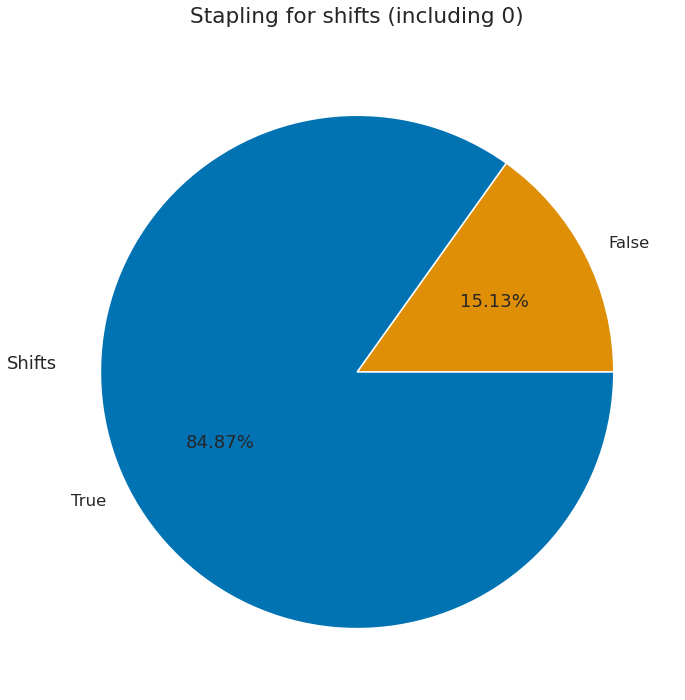

In [7]:
sns.set(
    context="talk",
    font_scale=1,  # make the font larger; default is pretty small
    style="ticks",  # make the background white with black lines
    palette="colorblind",  # a color palette that is colorblind friendly!
)
palette = list(sns.color_palette("colorblind", 256).as_hex())
palette = palette[:2]
palette.reverse()
fig, ax1 = plt.subplots(ncols=1, figsize=(20, 10), tight_layout=True)
scores_df.groupby("stapled").size().plot(
    kind="pie", autopct="%1.2f%%", colors=palette, ax=ax1
)
ax1.set_ylabel("Shifts", rotation=0)
plt.suptitle("Stapling for shifts (including 0)")
plt.savefig("figs/04_stapling_rate.png")

In [8]:
def parent2scaffold(row):
    parent = row["parent"]
    if "THR" in parent:
        scaffold = "THR"
    elif "TH_DHR" in parent:
        scaffold = "TH_DHR"
    elif "KH_" in parent:
        scaffold = "KH_DHR"
    elif "hDHR" in parent:
        scaffold = "hDHR"
    elif "DHR" in parent:
        scaffold = "DHR"
    else:
        raise RuntimeError
    return scaffold


scores_df["scaffold"] = scores_df.apply(parent2scaffold, axis=1)
scores_df.groupby(["scaffold"]).mean()

,9mer,cmsa_int,dslf_fa13,dslf_fa13_cart,fa_atr,fa_dun_dev,fa_dun_rot,fa_dun_semi,fa_elec,fa_intra_atr_xover4,...,ref,rmsd_cart,rmsd_dual,rmsd_nmp,sasa_int,sc_int,total_length,total_score,cart_bonded,coordinate_constraint
scaffold,,,,,,,,,,,,,,,,,,,,,
DHR,2.949087,593.596580,-0.411246,-0.375045,-1385.031824,24.905402,167.192833,232.978415,-513.201773,-75.218921,...,-24.245089,0.329957,0.829548,0.161940,2095.893232,0.782817,212.126121,-760.840073,90.021857,192.069868
KH_DHR,3.646250,486.917046,-0.128791,-0.076552,-1268.864256,23.696995,150.338663,248.543997,-469.653023,-75.108572,...,-26.552604,0.391589,0.721482,0.167869,1772.369652,0.785260,197.530864,-696.090535,79.333021,193.677944
THR,3.455431,690.422236,-0.399058,-0.371418,-2415.302645,45.619943,286.607015,397.449817,-863.978873,-137.586196,...,-35.623853,0.289965,0.846119,0.111969,2436.521567,0.770477,362.946293,-1333.639789,188.782409,216.450171
TH_DHR,3.372479,665.011398,-0.458448,-0.398436,-1649.454725,26.707796,192.561803,266.222281,-599.975055,-89.537433,...,24.439624,0.317613,0.728811,0.111135,2375.441388,0.782278,253.197682,-952.649721,158.575152,210.384908
hDHR,3.058575,539.387329,-0.301742,-0.267739,-1320.376488,22.252167,161.279599,226.462253,-490.940614,-74.148148,...,-26.644014,0.347289,0.649332,0.215302,1933.078935,0.787655,204.263825,-758.228206,85.001907,174.041524


Total stapled:
5396
After removing crazy outliers:
4734


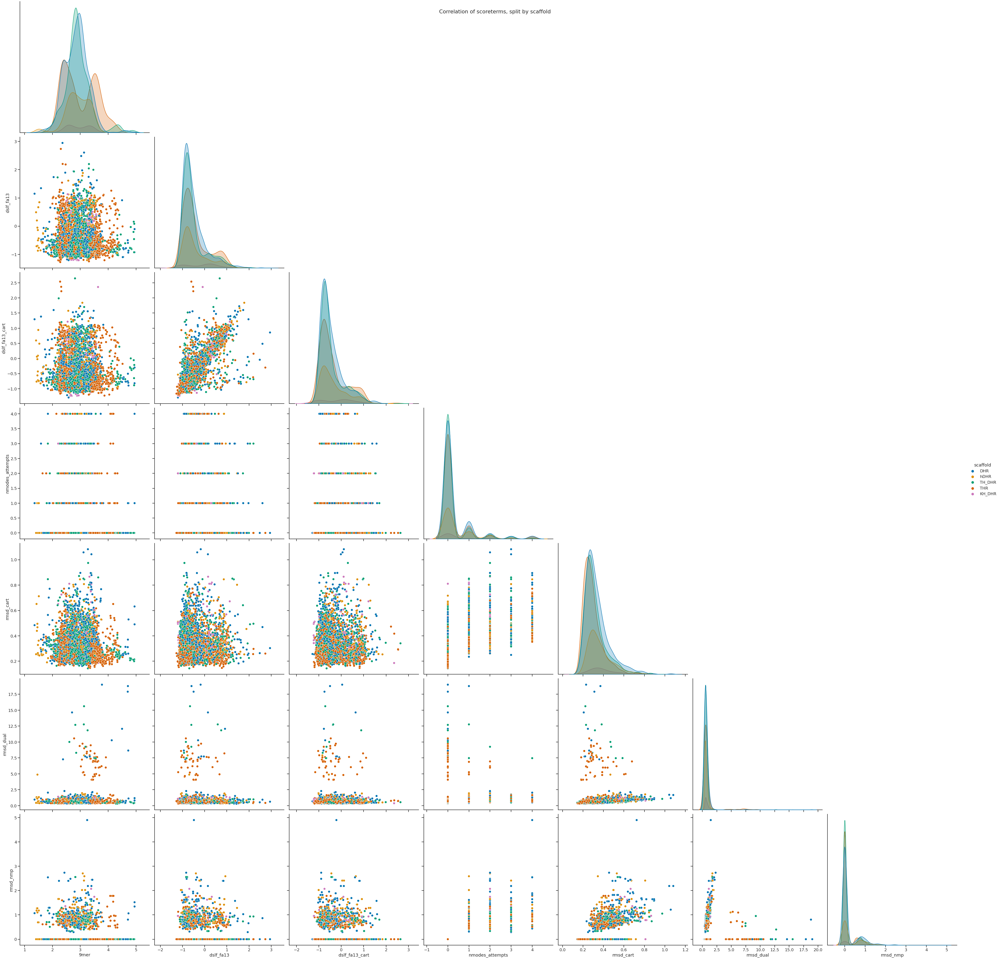

In [9]:
score_subset = scores_df[
    [
        "9mer",
        "dslf_fa13",
        "dslf_fa13_cart",
        "nmodes_attempts",
        "rmsd_cart",
        "rmsd_dual",
        "rmsd_nmp",
        "scaffold",
    ]
]

score_subset = score_subset[
    score_subset["9mer"] < 5
]  # don't want to plot the decoys with really bad 9mers
score_subset = score_subset[
    score_subset["dslf_fa13"] != 0
]  # don't want to plot the decoys with no disulfides
score_subset = score_subset[
    score_subset["dslf_fa13"] < 3
]  # don't want to plot the decoys with really bad disulfides
score_subset = score_subset[
    score_subset["dslf_fa13_cart"] < 3
]  # don't want to plot the decoys with really bad disulfides

print("Total stapled:")
print(len(scores_df[scores_df["stapled"] == "True"]))
print("After removing crazy outliers:")
print(len(score_subset))

hue_order = ["DHR", "hDHR", "TH_DHR", "THR", "KH_DHR"]

ax = sns.pairplot(
    data=score_subset, hue="scaffold", hue_order=hue_order, corner=True, height=8
)
plt.suptitle("Correlation of scoreterms, split by scaffold")
sns.despine()
plt.savefig("figs/04_correlations_split_by_scaffold.png")

Total stapled without iterating nmp:
3865


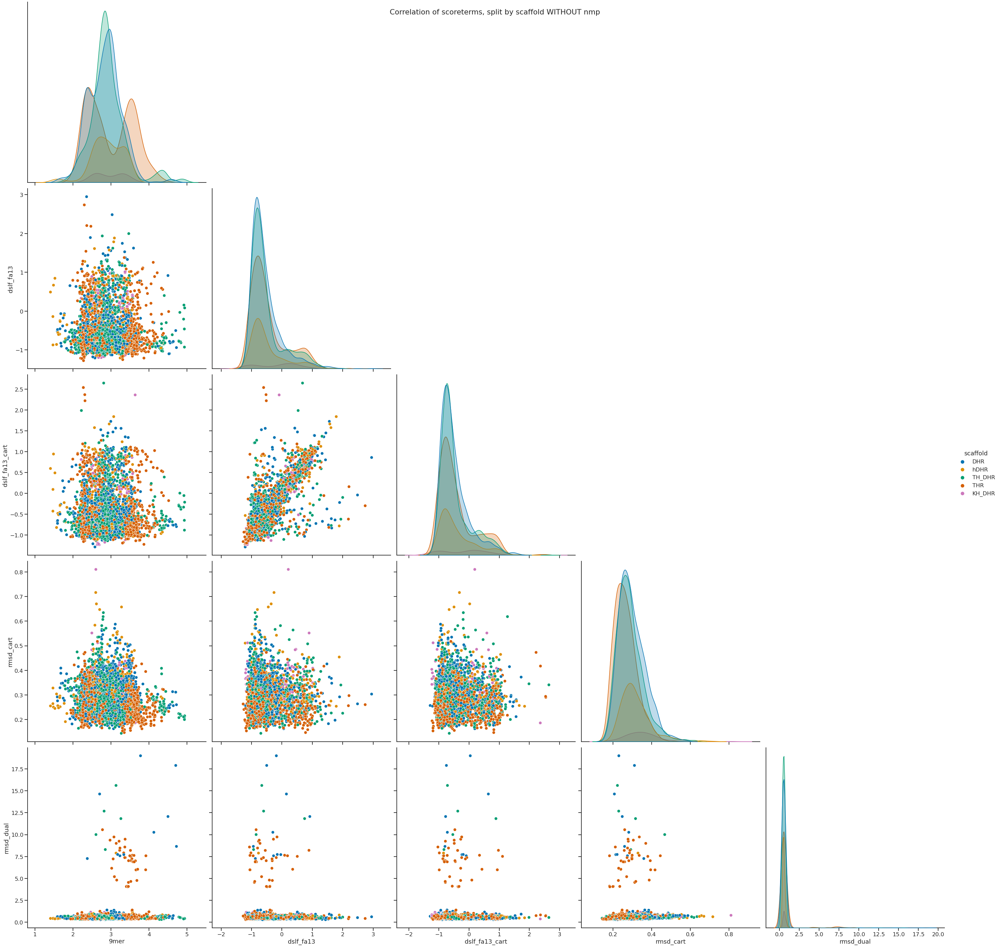

In [10]:
no_iter = score_subset[score_subset["nmodes_attempts"] == 0]

no_iter = no_iter[
    [
        "9mer",
        "dslf_fa13",
        "dslf_fa13_cart",
        "rmsd_cart",
        "rmsd_dual",
        "scaffold",
    ]
]


print("Total stapled without iterating nmp:")
print(len(no_iter))

ax = sns.pairplot(
    data=no_iter, hue="scaffold", hue_order=hue_order, corner=True, height=8
)
plt.suptitle("Correlation of scoreterms, split by scaffold WITHOUT nmp")
sns.despine()
plt.savefig("figs/04_correlations_split_by_scaffold_no_nmp.png")

Total stapled with iterating nmp:
869


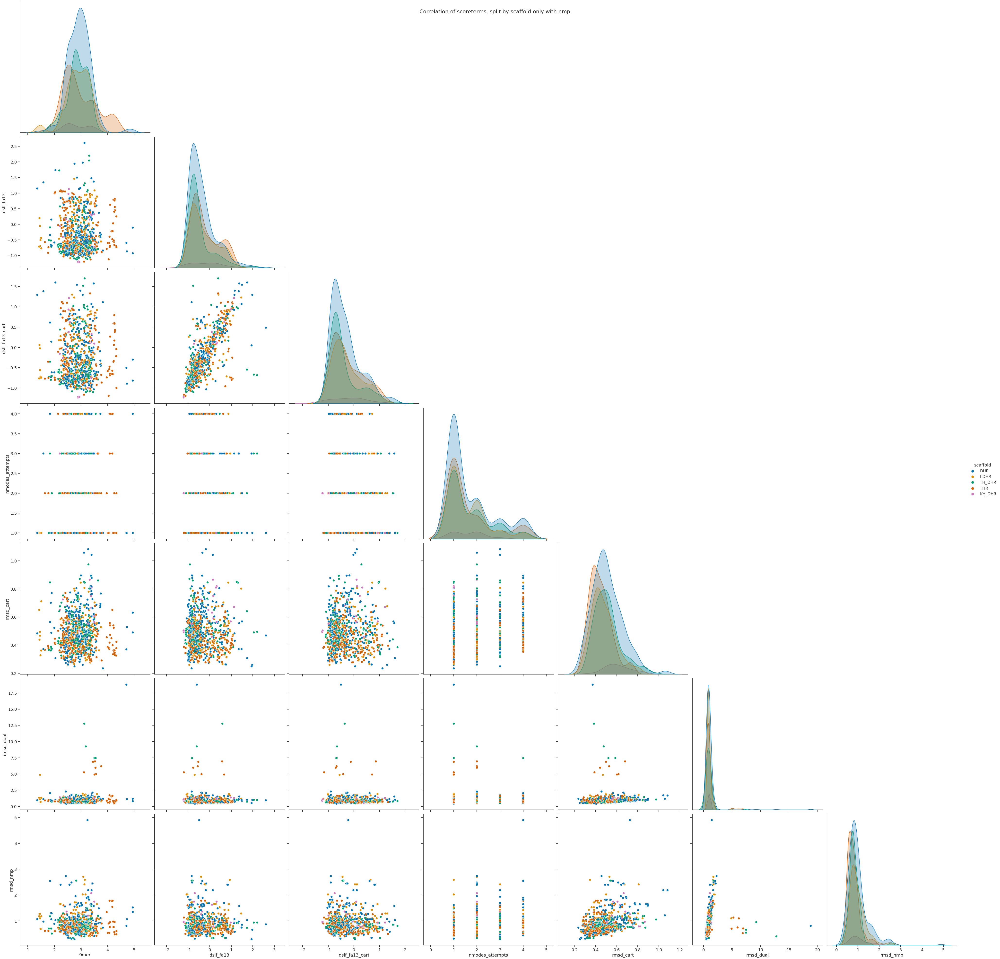

In [11]:
only_iter = score_subset[score_subset["nmodes_attempts"] != 0]

only_iter = only_iter[
    [
        "9mer",
        "dslf_fa13",
        "dslf_fa13_cart",
        "nmodes_attempts",
        "rmsd_cart",
        "rmsd_dual",
        "rmsd_nmp",
        "scaffold",
    ]
]


print("Total stapled with iterating nmp:")
print(len(only_iter))

ax = sns.pairplot(
    data=only_iter, hue="scaffold", hue_order=hue_order, corner=True, height=8
)
plt.suptitle("Correlation of scoreterms, split by scaffold only with nmp")
sns.despine()
plt.savefig("figs/04_correlations_split_by_scaffold_only_nmp.png")

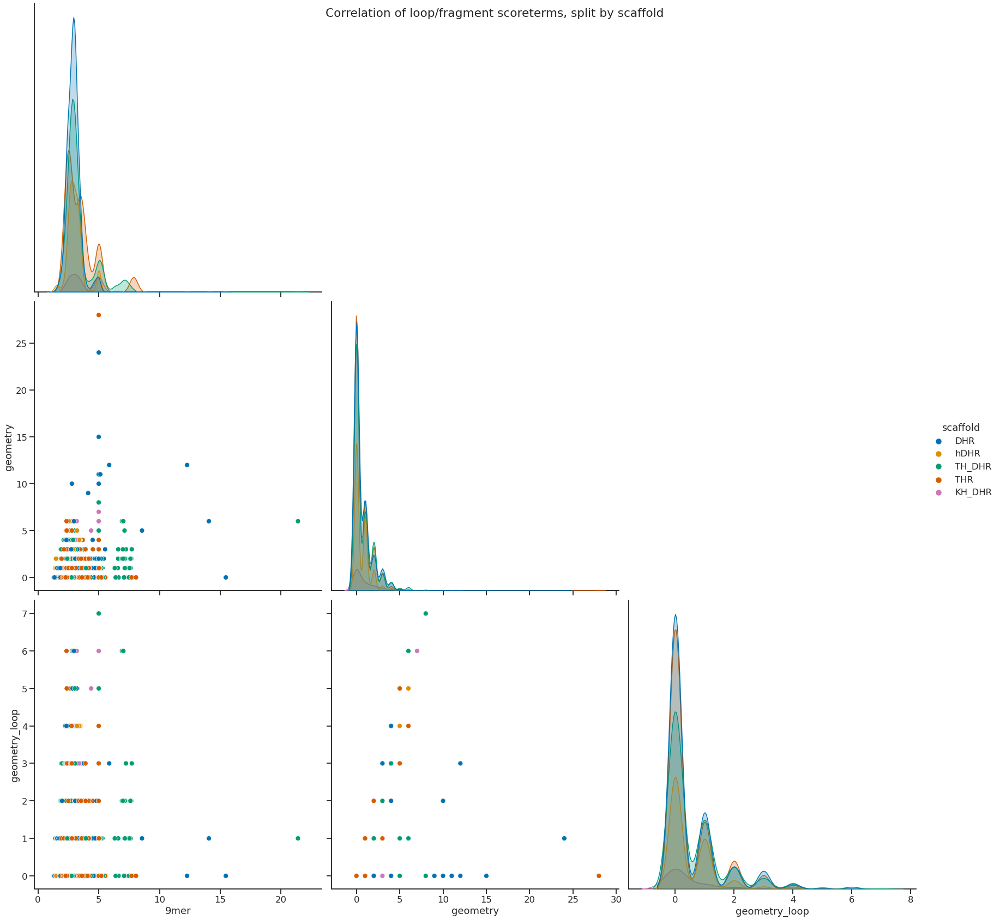

In [12]:
loop = scores_df[
    [
        "9mer",
        "geometry",
        "geometry_loop",
        "scaffold",
    ]
]

ax = sns.pairplot(data=loop, hue="scaffold", hue_order=hue_order, corner=True, height=8)
plt.suptitle("Correlation of loop/fragment scoreterms, split by scaffold")
sns.despine()
plt.savefig("figs/04_correlations_split_by_scaffold_loops.png")

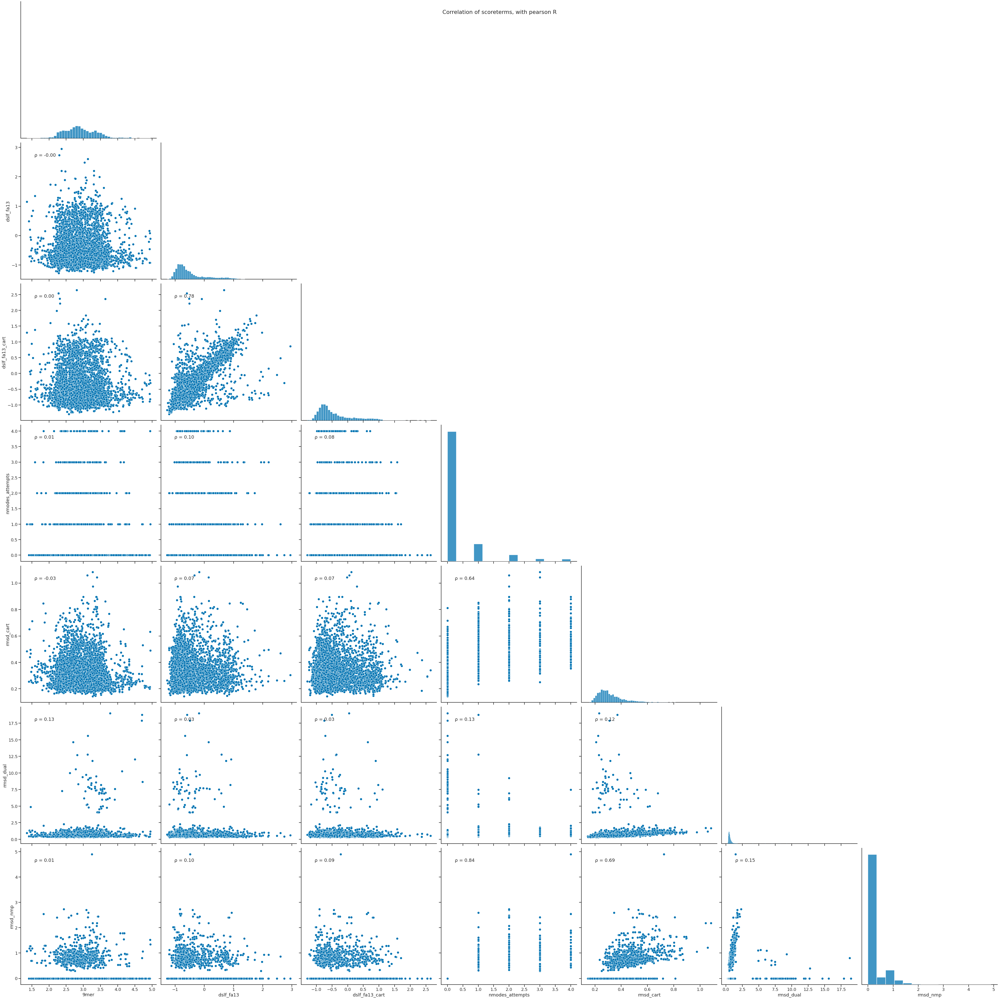

In [13]:
def rho(x, y, ax=None, **kwargs):
    """Plot the correlation coefficient in the top left hand corner of a plot.
    https://stackoverflow.com/questions/50832204/show-correlation-values-in-pairplot-using-seaborn-in-python/50835066
    """
    import scipy

    r, _ = scipy.stats.pearsonr(x, y)
    ax = ax or plt.gca()
    # Unicode for lowercase rho (ρ)
    rho = "\u03C1"
    ax.annotate(f"{rho} = {r:.2f}", xy=(0.1, 0.9), xycoords=ax.transAxes)


ax = sns.pairplot(data=score_subset, corner=True, height=8)
ax.map_lower(rho)
plt.suptitle("Correlation of scoreterms, with pearson R")
sns.despine()
plt.savefig("figs/04_correlations_pearson.png")

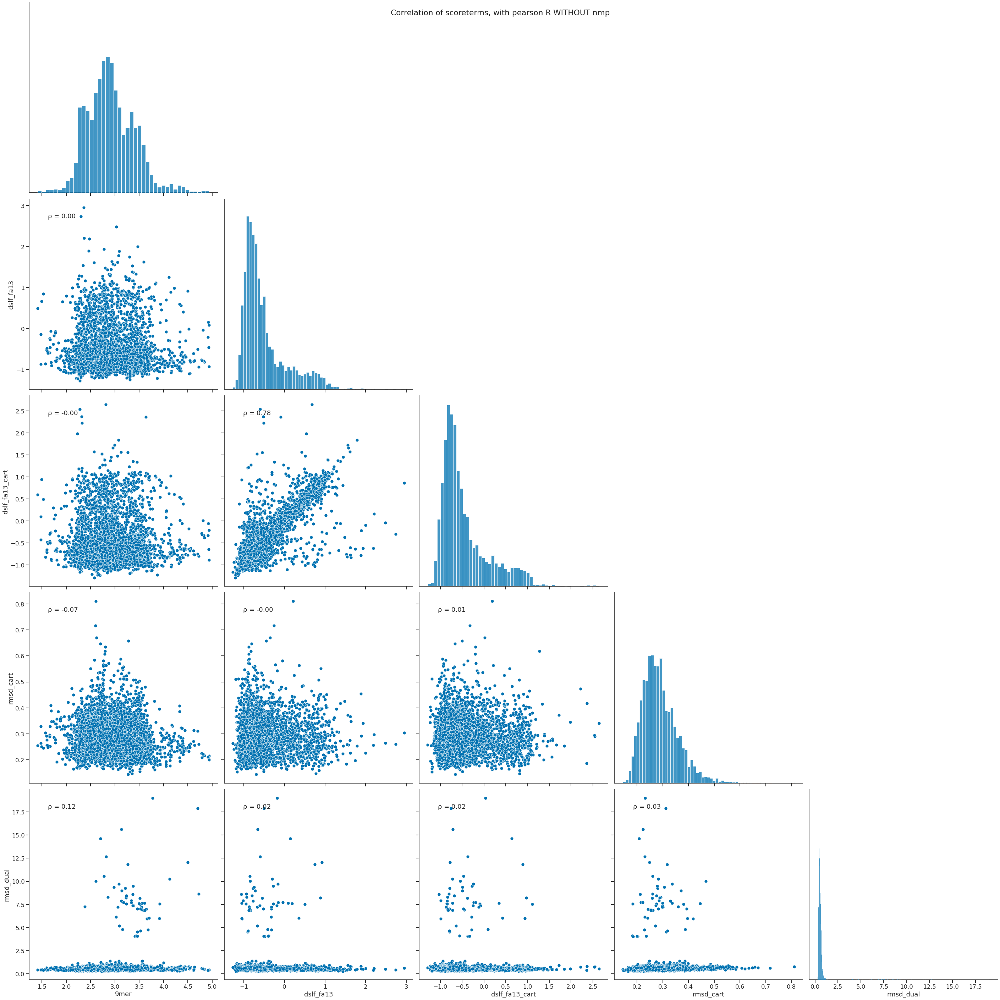

In [14]:
ax = sns.pairplot(data=no_iter, corner=True, height=8)
ax.map_lower(rho)
plt.suptitle("Correlation of scoreterms, with pearson R WITHOUT nmp")
sns.despine()
plt.savefig("figs/04_correlations_pearson_no_nmp.png")

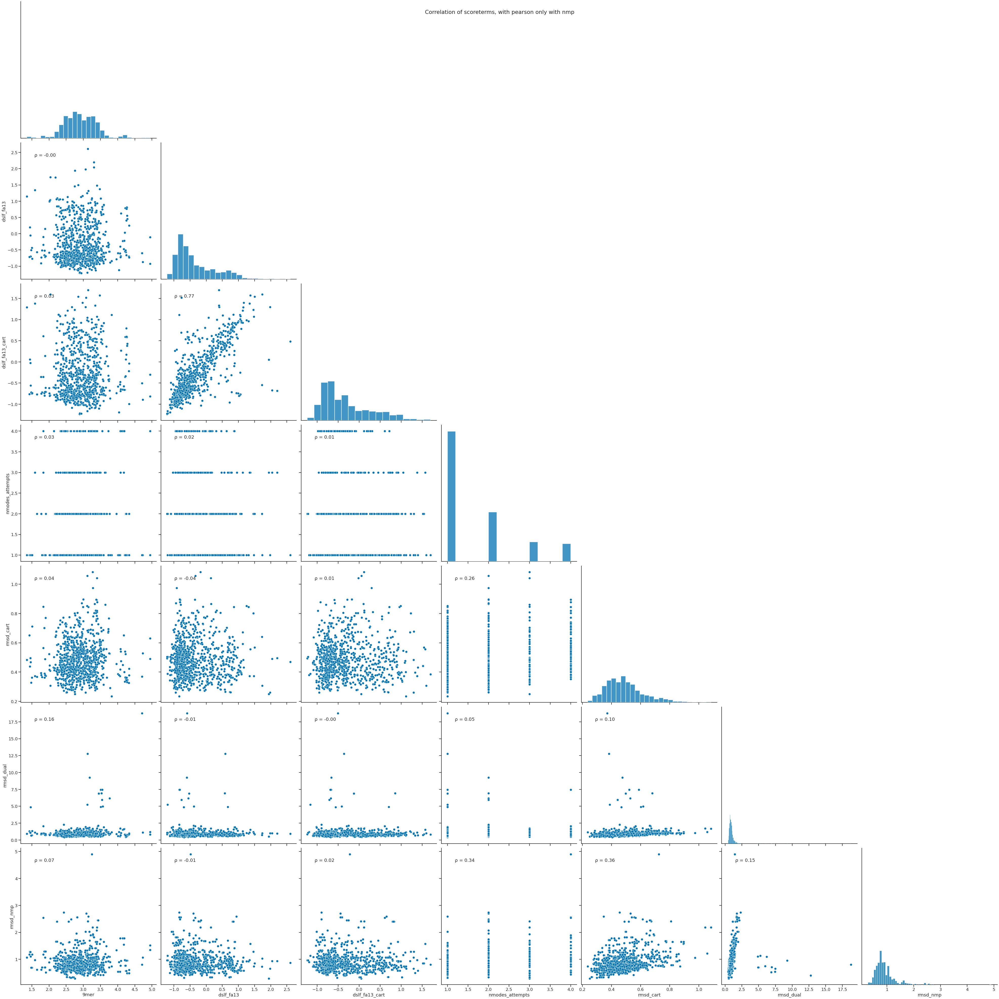

In [15]:
ax = sns.pairplot(data=only_iter, corner=True, height=8)
ax.map_lower(rho)
plt.suptitle("Correlation of scoreterms, with pearson only with nmp")
sns.despine()
plt.savefig("figs/04_correlations_pearson_only_nmp.png")

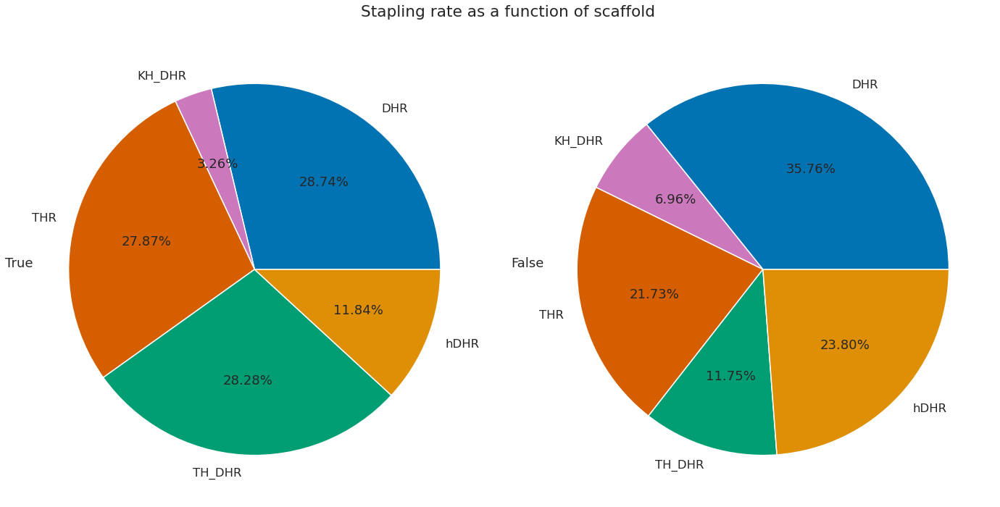

In [16]:
palette = list(sns.color_palette("colorblind", 256).as_hex())
palette = [palette[0], palette[4], palette[3], palette[2], palette[1]]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10), tight_layout=True)
scores_df[scores_df["stapled"] == "True"].groupby("scaffold").size().plot(
    kind="pie", autopct="%1.2f%%", colors=palette, ax=ax1
)
scores_df[scores_df["stapled"] == "False"].groupby("scaffold").size().plot(
    kind="pie", autopct="%1.2f%%", colors=palette, ax=ax2
)
ax1.set_ylabel("True", rotation=0)
ax2.set_ylabel("False", rotation=0)
plt.suptitle("Stapling rate as a function of scaffold")
plt.savefig("figs/04_stapling_rate_groupby_scaffold.png")

### Looks like the less straight DHRs were harder to staple
In general, these nonzero states get less hits

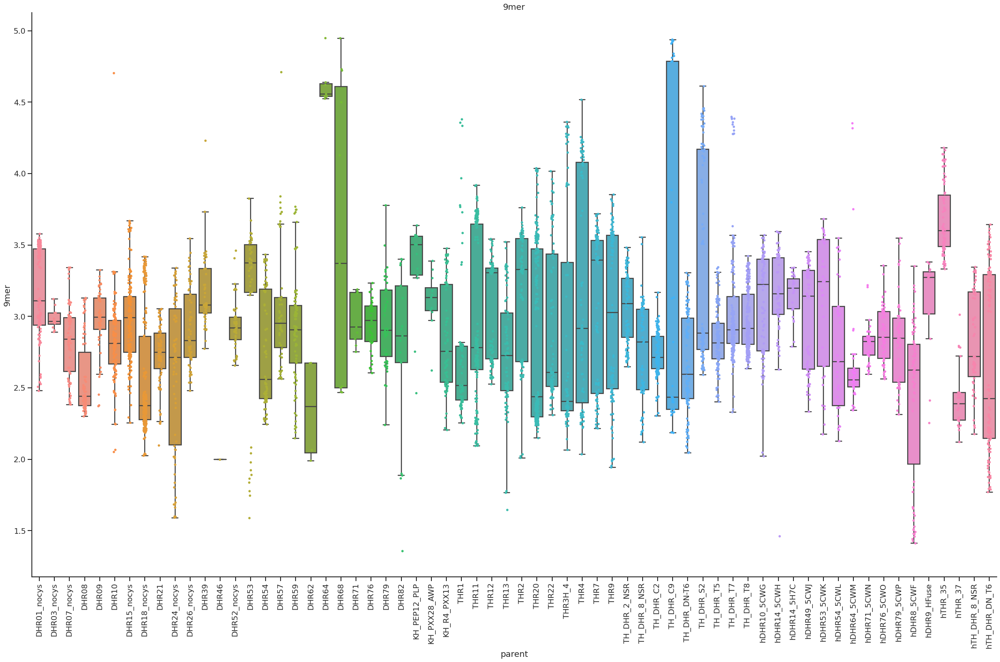

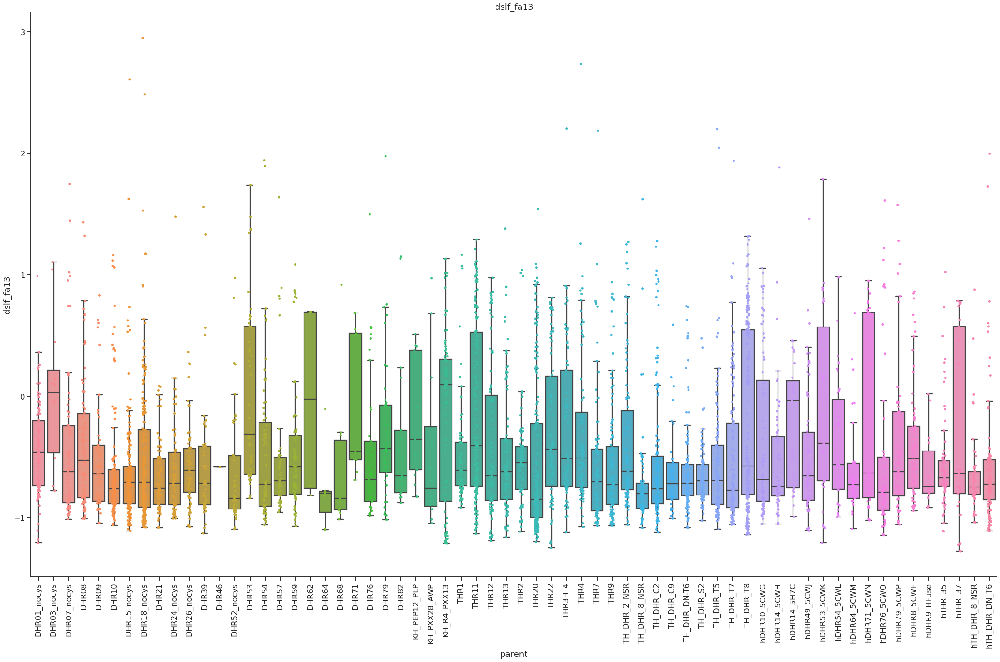

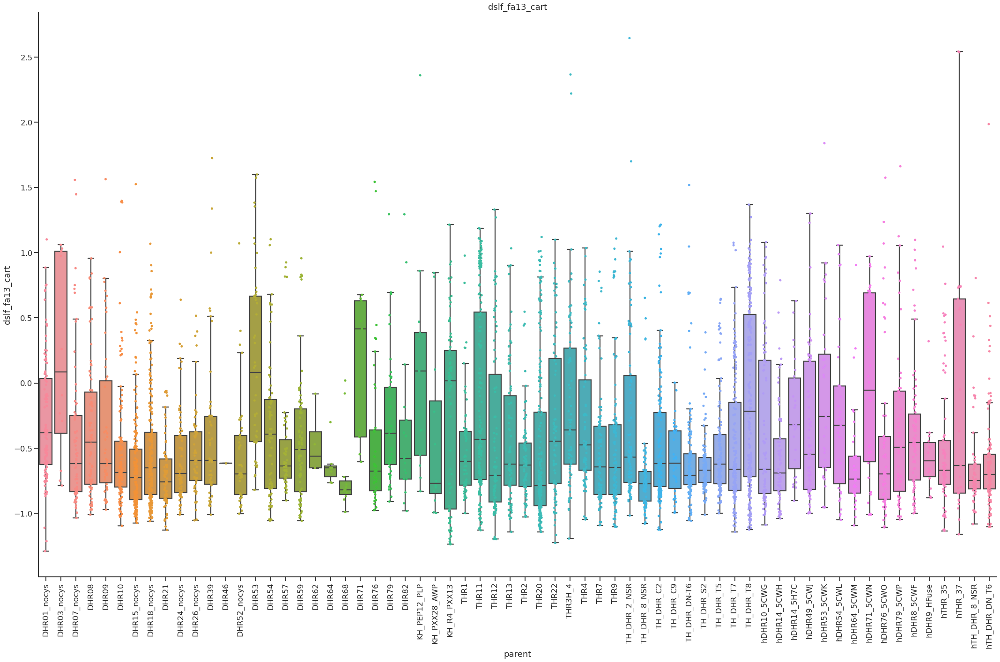

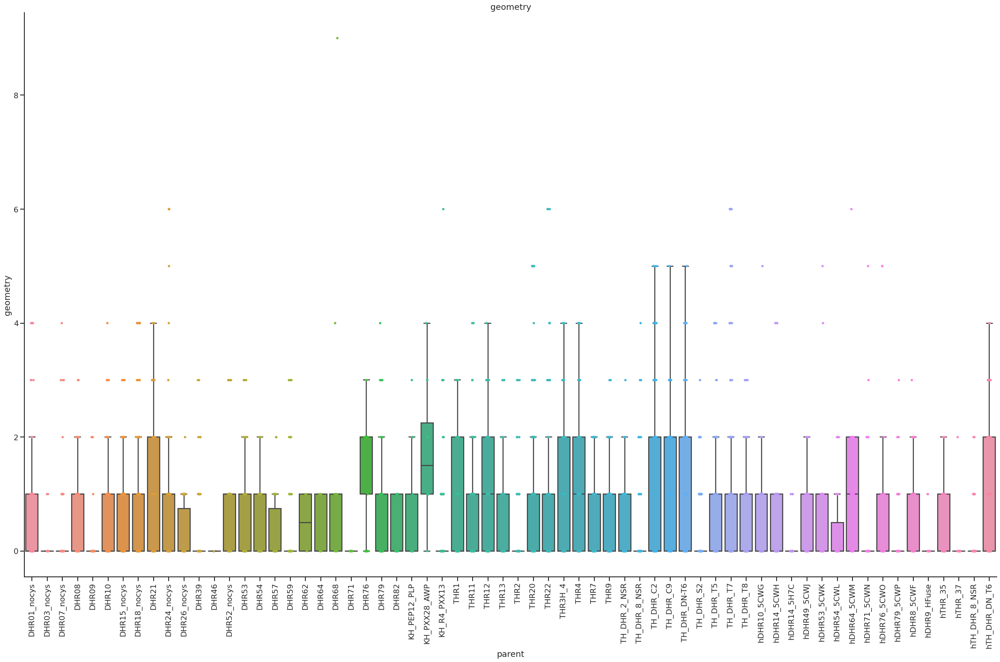

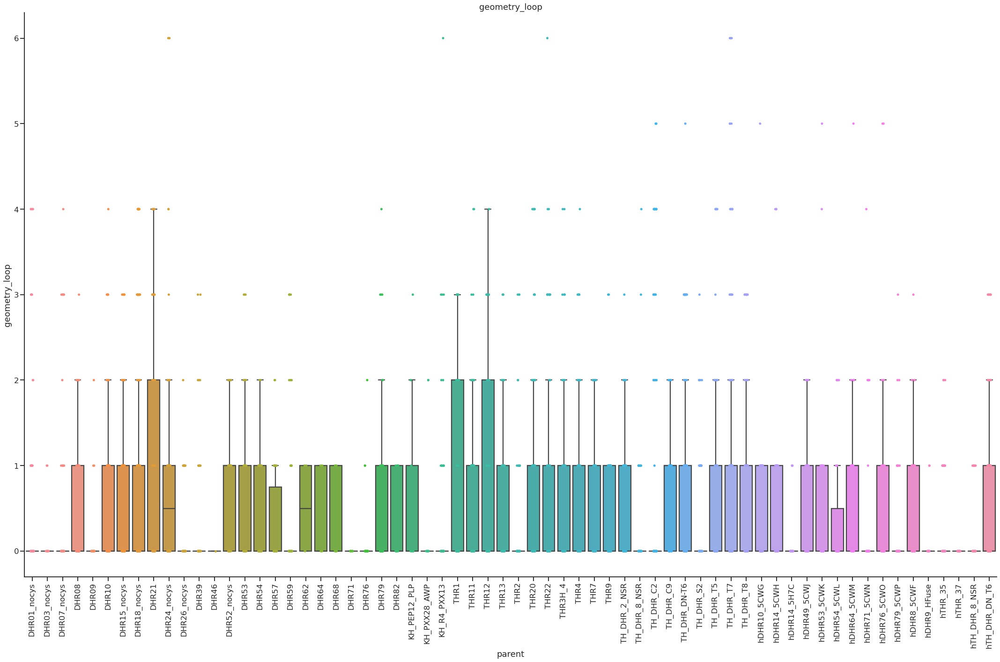

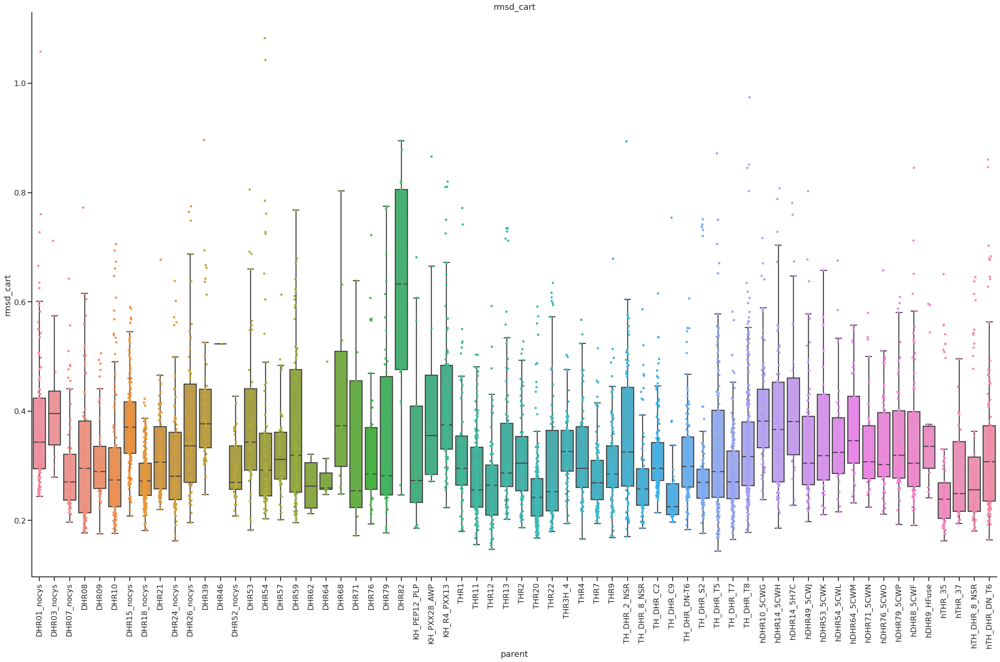

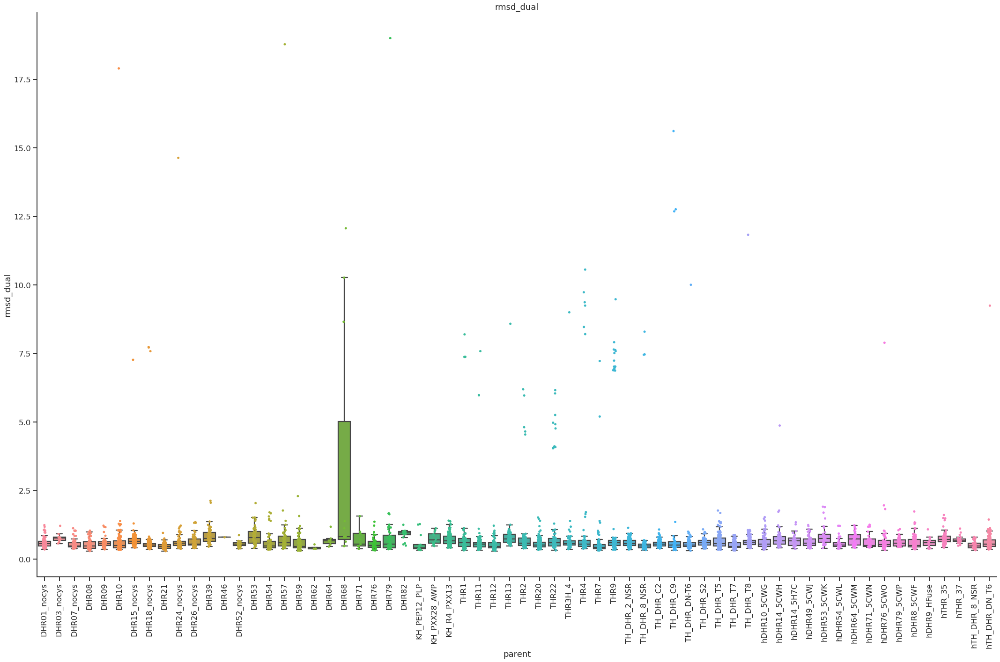

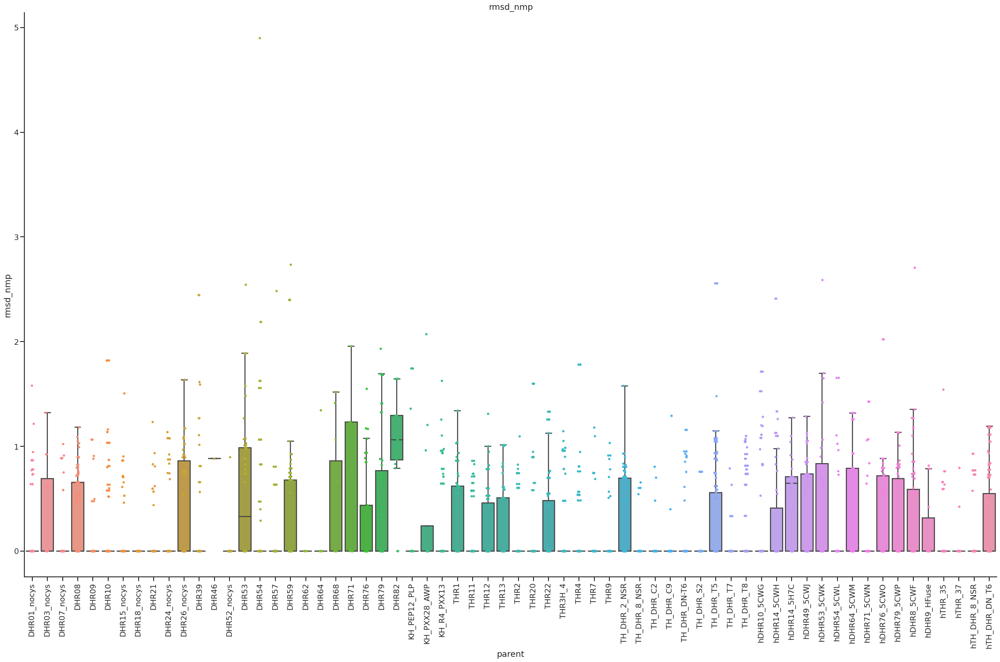

In [17]:
terms = [
    "9mer",
    "dslf_fa13",
    "dslf_fa13_cart",
    "geometry",
    "geometry_loop",
    "rmsd_cart",
    "rmsd_dual",
    "rmsd_nmp",
]
score_subset = scores_df[terms + ["parent"]]

score_subset = score_subset[
    score_subset["9mer"] < 5
]  # don't want to plot the decoys with really bad 9mers
score_subset = score_subset[
    score_subset["dslf_fa13"] != 0
]  # don't want to plot the decoys with no disulfides
score_subset = score_subset[
    score_subset["dslf_fa13"] < 3
]  # don't want to plot the decoys with really bad disulfides
score_subset = score_subset[
    score_subset["dslf_fa13_cart"] < 3
]  # don't want to plot the decoys with really bad disulfides
score_subset = score_subset[
    score_subset["rmsd_cart"] < 1.5
]  # don't want to plot the decoys with really bad disulfides

order = sorted(list(set(scores_df.parent.values)))

for term in terms:
    fig = plt.figure(figsize=(30, 20), tight_layout=True)
    plt.xticks(rotation=90)
    sns.boxplot(
        x="parent",
        y=term,
        data=score_subset,
        showfliers=False,
        order=order,
    )
    sns.stripplot(
        x="parent",
        y=term,
        data=score_subset,
        order=order,
    )
    sns.swarmplot(
        x="parent",
        y=term,
        data=ref_df,
        color="black",
        order=order,
    )
    sns.despine()
    plt.title(term)
    plt.show()
    plt.close()
    fig.savefig("figs/04_all_parents_vs_{term}.png".format(term=term))

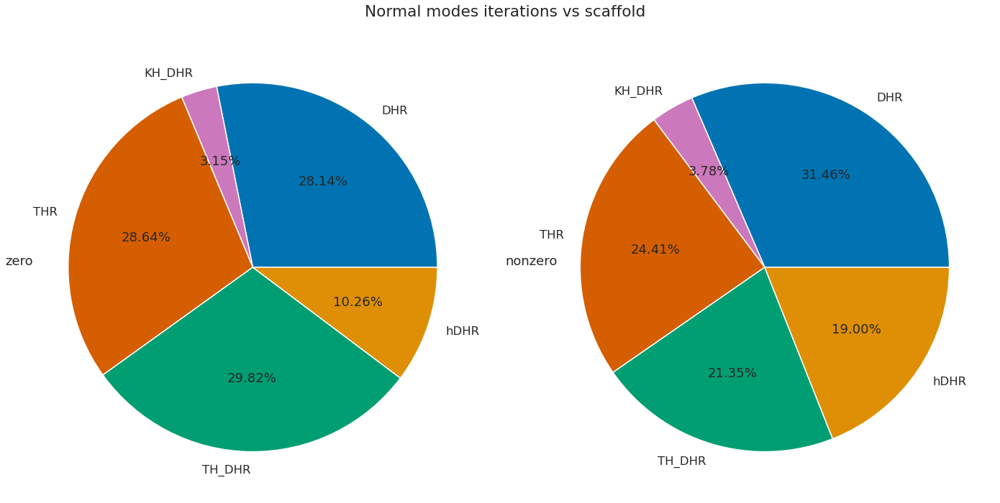

In [18]:
palette = list(sns.color_palette("colorblind", 256).as_hex())
palette = [palette[0], palette[4], palette[3], palette[2], palette[1]]
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10), tight_layout=True)

all_stapled = scores_df[scores_df["stapled"] == "True"]
all_stapled[all_stapled["nmodes_attempts"] == 0].groupby("scaffold").size().plot(
    kind="pie", autopct="%1.2f%%", colors=palette, ax=ax1
)
all_stapled[all_stapled["nmodes_attempts"] != 0].groupby("scaffold").size().plot(
    kind="pie", autopct="%1.2f%%", colors=palette, ax=ax2
)
ax1.set_ylabel("zero", rotation=0)
ax2.set_ylabel("nonzero", rotation=0)
plt.suptitle("Normal modes iterations vs scaffold")
plt.savefig("figs/04_nmodes_iter_groupby_scaffold.png")

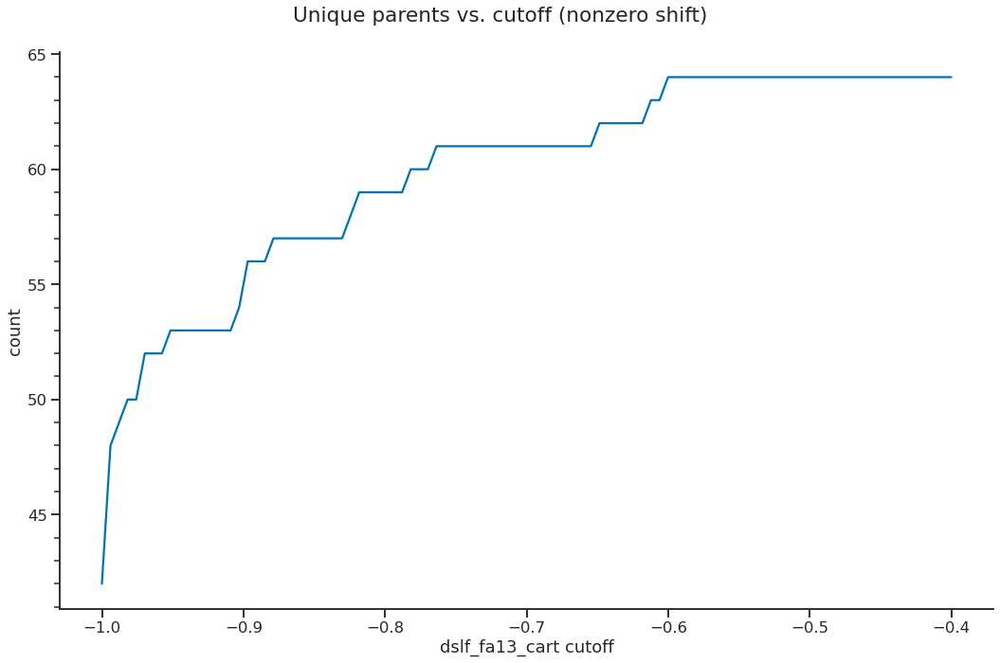

In [19]:
from matplotlib.ticker import MultipleLocator

not_bad = scores_df[scores_df["stapled"] == "True"]  # only want stapled structures
not_bad = not_bad[not_bad["9mer"] < 5]  # discard extremely bad fragments

cutoffs, num = [], []
fig = plt.figure(figsize=(15, 10), tight_layout=True)

filtered = not_bad[not_bad["shift"] != 0]

for cutoff in np.linspace(-0.4, -1, 100):
    filtered = filtered[filtered["dslf_fa13_cart"] < cutoff]
    cutoffs.append(cutoff), num.append(len(set(filtered.parent.values)))

ax = sns.lineplot(x=cutoffs, y=num)
sns.despine()
_ = plt.yticks([45, 50, 55, 60, 65])
ax.yaxis.set_minor_locator(MultipleLocator(1))
plt.xlabel("dslf_fa13_cart cutoff")
plt.ylabel("count")
plt.suptitle("Unique parents vs. cutoff (nonzero shift)")
plt.savefig("figs/04_cutoff_vs_unique_parents_nonzero_shift.png")

### In terms of cutoffs, Adam said to go with `-0.8` for `dslf_fa13`

In [20]:
not_bad_nozero = not_bad[
    not_bad["dslf_fa13_cart"] < -0.8
]  # discard the disulfides that are unlikely to form
not_bad_nozero = not_bad_nozero[not_bad_nozero["shift"] != "0"]  # get nonzero states
not_bad_zero = not_bad[not_bad["shift"] == "0"]  # get nonzero states

print("Unique parents: " + str(len(not_bad_nozero.groupby("parent").size())))

Unique parents: 59


In [21]:
best_nozero = not_bad_nozero[not_bad_nozero["rmsd_cart"] < 0.5]
best_zero = not_bad_zero[not_bad_zero["rmsd_cart"] < 0.5]

print("Unique parents: " + str(len(best_nozero.groupby("parent").size())))

Unique parents: 59


In [22]:
best_nozero["state"] = (
    best_nozero["parent"]
    + "_p_"
    + best_nozero["pivot_helix"].astype(int).astype(str)
    + "_s_"
    + best_nozero["shift"].astype(int).astype(str)
)
best_nozero.groupby("state").size()

<ipython-input-22-ec123f778ac2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  best_nozero["state"] = (


state
DHR01_nocys_p_4_s_-3       1
DHR01_nocys_p_4_s_-7       1
DHR01_nocys_p_5_s_-3       1
DHR01_nocys_p_5_s_1        3
DHR01_nocys_p_5_s_4        2
                          ..
hTH_DHR_DN_T6_p_4_s_4      4
hTH_DHR_DN_T6_p_4_s_5      3
hTH_DHR_DN_T6_p_5_s_-3    12
hTH_DHR_DN_T6_p_5_s_1      6
hTH_DHR_DN_T6_p_5_s_4      1
Length: 257, dtype: int64

In [23]:
unique_dslf = 0
for unique in set(best_nozero.state.values):
    subset = best_nozero[best_nozero["state"] == unique]
    unique_dslf += len(set(subset.disulfide_at.values))

print("Total states: ", str(len(best_nozero)))
print("Unique states: ", str(len(set(best_nozero.state.values))))
print("Total unique disulfides: ", str(unique_dslf))

Total states:  1169
Unique states:  257
Total unique disulfides:  425


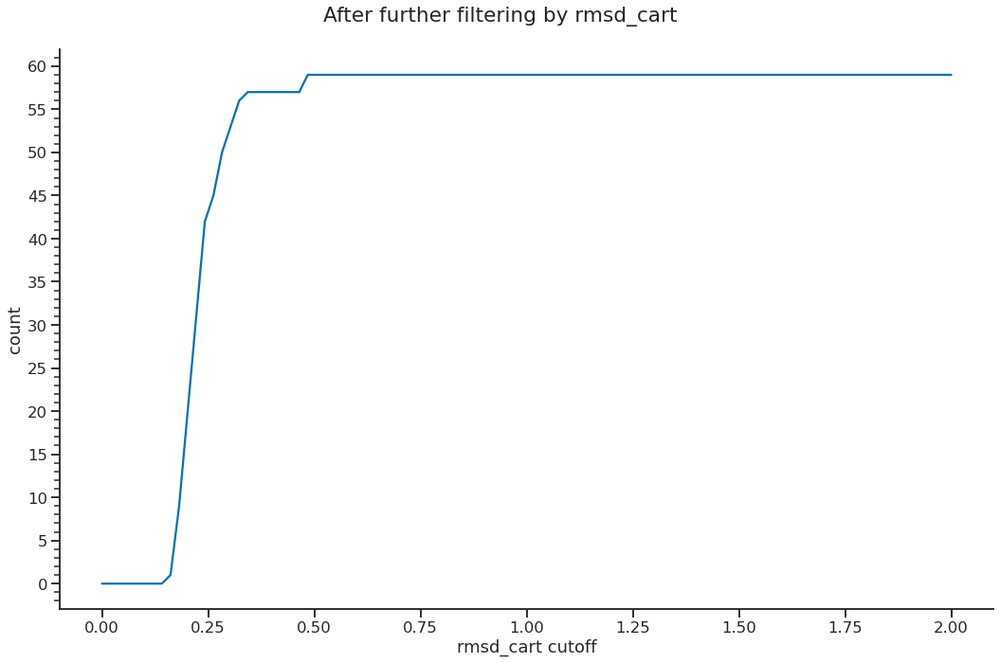

In [24]:
cutoffs, num = [], []
fig = plt.figure(figsize=(15, 10), tight_layout=True)

for cutoff in np.linspace(2.0, 0.0, 100):
    filtered = not_bad_nozero[not_bad_nozero["rmsd_cart"] < cutoff]
    cutoffs.append(cutoff), num.append(len(set(filtered.parent.values)))

ax = sns.lineplot(x=cutoffs, y=num)
sns.despine()
_ = plt.yticks(list(range(0, 65, 5)))
ax.yaxis.set_minor_locator(MultipleLocator(1))
plt.xlabel("rmsd_cart cutoff")
plt.ylabel("count")
plt.suptitle("After further filtering by rmsd_cart")
plt.savefig("figs/04_rmsd_cutoff_vs_unique_parents_nonzero_shift.png")

# Saving list of the best designs
For the nonzero states

In [27]:
out_path = os.path.join(os.getcwd(), "04_pack_staple_pair")
with open(os.path.join(out_path, "best_nozero.list"), "w+") as f:
    for decoy in best_nozero.index:
        print(decoy, file=f)
out_path = os.path.join(os.getcwd(), "04_staple_ref")
with open(os.path.join(out_path, "best_zero.list"), "w+") as f:
    for decoy in best_zero.index:
        print(decoy, file=f)

# For all of the best nonzero states, check their disulfides against their reference parents
Here's a protocol that does this

In [28]:
from pyrosetta.distributed.packed_pose.core import PackedPose
from pyrosetta.distributed import requires_init


@requires_init
def force_then_relax(packed_pose_in: PackedPose, **kwargs) -> PackedPose:
    """
    Check the disulfide location in the input pose, find the corresponding reference pose,
    force in a disulfide to the reference pose, relax the reference pose in cartesian space,
    record rmsd and dslf_fa13, return the input pose with rmsd_swap and dslf_fa13_swap
    @pleung
    """
    import bz2
    from glob import glob
    import os
    import pyrosetta
    import pyrosetta.distributed.io as io
    from pyrosetta.distributed.tasks.rosetta_scripts import (
        SingleoutputRosettaScriptsTask,
    )

    if packed_pose_in == None:
        file = kwargs["-s"]
        with open(file, "rb") as f:
            packed_pose_in = io.pose_from_pdbstring(bz2.decompress(f.read()).decode())
        scores = pyrosetta.distributed.cluster.get_scores_dict(file)["scores"]
    else:
        raise RuntimeError("Need to supply an input")

    dslf_at = scores["disulfide_at"]
    dslf_loc = ":".join([x + "A" for x in dslf_at.split(",")])
    ref_parent = scores["parent"] + ".pdb"
    paths = glob(os.path.join(os.getcwd(), "00_inputs/*/*.pdb"))
    ref_path = None
    for path in paths:
        if ref_parent in path:
            ref_path = path
            break
        else:
            pass
    assert ref_path is not None
    ref_ppose = io.pose_from_file(path)

    xml = """
    <ROSETTASCRIPTS>
        <SCOREFXNS>
            <ScoreFunction name="sfxn_cart" weights="ref2015_cart" /> 
            <ScoreFunction name="sfxn" weights="ref2015" /> 
        </SCOREFXNS>
        <RESIDUE_SELECTORS>            
        </RESIDUE_SELECTORS>
        <TASKOPERATIONS>
            <PruneBuriedUnsats name="prune" allow_even_trades="false" 
                atomic_depth_cutoff="3.5" minimum_hbond_energy="-1.0"/>
            <LimitAromaChi2 name="arochi" chi2max="110" chi2min="70" include_trp="True" />
            <ExtraRotamersGeneric name="ex1_ex2" ex1="1" ex2="1" />
        </TASKOPERATIONS>
        <FILTERS>
            <Rmsd name="rmsd_cart" reference_name="before_relax" chains="AB" superimpose="1" threshold="5" by_aln="0" confidence="0" />
        </FILTERS>
        <MOVERS>
            <SavePoseMover name="save_before_relax" restore_pose="0" reference_name="before_relax"/>
            <MutateResidue name="cys1" target="{cys1}" new_res="CYS" />
            <MutateResidue name="cys2" target="{cys2}" new_res="CYS" />
            <ForceDisulfides name="force_disulfides" 
                scorefxn="sfxn_cart"
                disulfides="{dslf_loc}"
                remove_existing="false"
                repack="true" />
            <FastRelax name="relax" scorefxn="sfxn_cart"
                task_operations="arochi,prune,ex1_ex2"
                repeats="2"
                relaxscript="MonomerRelax2019"
                cartesian="true"
                bondangle="true"
                bondlength="true" >
                    <MoveMap name="mm" bb="true" chi="true" jump="false" />                        
            </FastRelax>
        </MOVERS>
        <PROTOCOLS>
            <Add mover="cys1" />
            <Add mover="cys2" />
            <Add mover="save_before_relax" />
            <Add mover="force_disulfides" />
            <Add mover="relax" />            
            <Add filter="rmsd_cart" />            
        </PROTOCOLS>
        <OUTPUT scorefxn="sfxn" />
    </ROSETTASCRIPTS>
    """.format(
        dslf_loc=dslf_loc,
        cys1=dslf_loc.split(":")[0],
        cys2=dslf_loc.split(":")[-1],
    )
    relax = SingleoutputRosettaScriptsTask(xml)
    # relax the pose to get scores
    relax_ppose = relax(ref_ppose.pose.clone())
    # keep the original pose...
    pose = io.to_pose(packed_pose_in)
    # ... get the cartesian-relaxed disulfide scores and rmsd...
    update = relax_ppose.pose.scores
    dslf_fa13_swap = update["dslf_fa13"]
    rmsd_swap = update["rmsd_cart"]
    # ... add the original scores ...
    for key, value in scores.items():
        pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, key, value)
    # ... and finally add the cartesian-relaxed disulfide scores and rmsd
    pyrosetta.rosetta.core.pose.setPoseExtraScore(
        pose, "dslf_fa13_swap", dslf_fa13_swap
    )
    pyrosetta.rosetta.core.pose.setPoseExtraScore(pose, "rmsd_swap", rmsd_swap)
    final_ppose = io.to_packed(pose)
    return final_ppose

# Setup dask, set command line options, make tasks and submit to client again to check swapped disulfides

In [ ]:
from dask.distributed import Client
from dask_jobqueue import SLURMCluster
import logging
import pwd
from pyrosetta.distributed.cluster.core import PyRosettaCluster


print("run the following from your local terminal:")
print(
    f"ssh -L 8000:localhost:8787 {pwd.getpwuid(os.getuid()).pw_name}@{socket.gethostname()}"
)


def create_tasks(selected, options):
    with open(selected, "r") as f:
        for file in f:
            tasks = {"options": ""}
            tasks["extra_options"] = options
            tasks["-s"] = file.rstrip()
            yield tasks


logging.basicConfig(level=logging.INFO)
selected = os.path.join(os.getcwd(), "04_pack_staple_pair/best_nozero.list")

options = {
    "-out:level": "300",
    "-holes:dalphaball": "/home/bcov/ppi/tutorial_build/main/source/external/DAlpahBall/DAlphaBall.gcc",
    "-indexed_structure_store:fragment_store": "/net/databases/VALL_clustered/connect_chains/ss_grouped_vall_helix_shortLoop.h5",
}

output_path = os.path.join(os.getcwd(), "04_pairs")

if __name__ == "__main__":
    # configure SLURM cluster as a context manager
    with SLURMCluster(
        cores=1,
        processes=1,
        job_cpu=1,
        memory="7GB",
        queue="medium",
        walltime="23:30:00",
        death_timeout=120,
        local_directory="$TMPDIR/dask",
        log_directory="/mnt/home/pleung/logs/slurm_logs",
        extra=["--lifetime", "23h", "--lifetime-stagger", "4m"],
    ) as cluster:
        print(cluster.job_script())
        # scale between 1-1020 workers,
        cluster.adapt(
            minimum=1,
            maximum=1020,
            wait_count=999,  # Number of consecutive times that a worker should be suggested for removal it is removed
            interval="5s",  # Time between checks
        )
        # setup a client to interact with the cluster as a context manager
        with Client(cluster) as client:
            print(client)
            PyRosettaCluster(
                tasks=create_tasks(selected, options),
                client=client,
                scratch_dir=output_path,
                output_path=output_path,
            ).distribute(protocols=[force_then_relax])

<AxesSubplot:xlabel='rmsd_swap', ylabel='Count'>

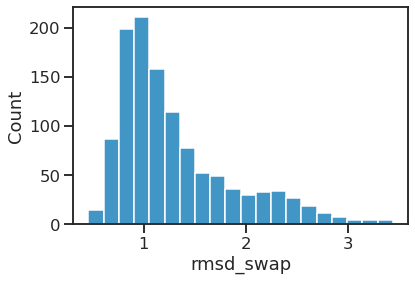

In [29]:
output_path = os.path.join(os.getcwd(), "04_pairs")
scores = os.path.join(output_path, "scores.json")
forced = read_scorefile(scores)
forced.head()
sns.histplot(forced["rmsd_swap"], bins=20)

<AxesSubplot:xlabel='dslf_fa13_swap', ylabel='Count'>

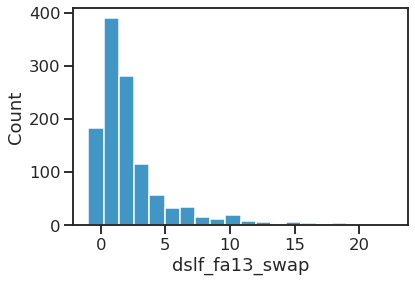

In [30]:
sns.histplot(forced["dslf_fa13_swap"], bins=20)

In [31]:
len(set(forced.parent.values))

59

In [32]:
def row2state(row):
    state = row["parent"] + "_p_" + row["pivot_helix"] + "_s_" + row["shift"]
    return state


forced["state"] = forced.apply(row2state, axis=1)

In [33]:
unique_dslf = 0
for unique in set(forced.state.values):
    subset = forced[forced["state"] == unique]
    unique_dslf += len(set(subset.disulfide_at.values))

print("Total states: ", str(len(forced)))
print("Unique states: ", str(len(set(forced.state.values))))
print("Total unique disulfides: ", str(unique_dslf))

Total states:  1169
Unique states:  257
Total unique disulfides:  425


In [34]:
good_swap = forced[forced["dslf_fa13_swap"] > 0]
good_swap = good_swap[good_swap["rmsd_swap"] > 0.8]

unique_dslf = 0
for unique in set(good_swap.state.values):
    subset = good_swap[good_swap["state"] == unique]
    unique_dslf += len(set(subset.disulfide_at.values))

print("Total states: ", str(len(good_swap)))
print("Unique states: ", str(len(set(good_swap.state.values))))
print("Total unique disulfides: ", str(unique_dslf))

Total states:  909
Unique states:  228
Total unique disulfides:  354


In [35]:
set(scores_df.parent.values) - (set(good_swap.parent.values))

{'DHR03_nocys', 'DHR46', 'DHR57', 'DHR62', 'DHR64', 'DHR71', 'KH_PEP12_PLP'}

In [36]:
len(set(good_swap.parent.values))

57

In [37]:
dslfs, rmsds, num = [], [], []
for dslf in np.linspace(10, -2, 100):
    for rmsd in np.linspace(0.0, 3.0, 100):

        filtered = forced[forced["dslf_fa13_swap"] > dslf]
        filtered = filtered[filtered["rmsd_swap"] > rmsd]
        dslfs.append(dslf)
        rmsds.append(rmsd)
        num.append(len(set(filtered.parent.values)))

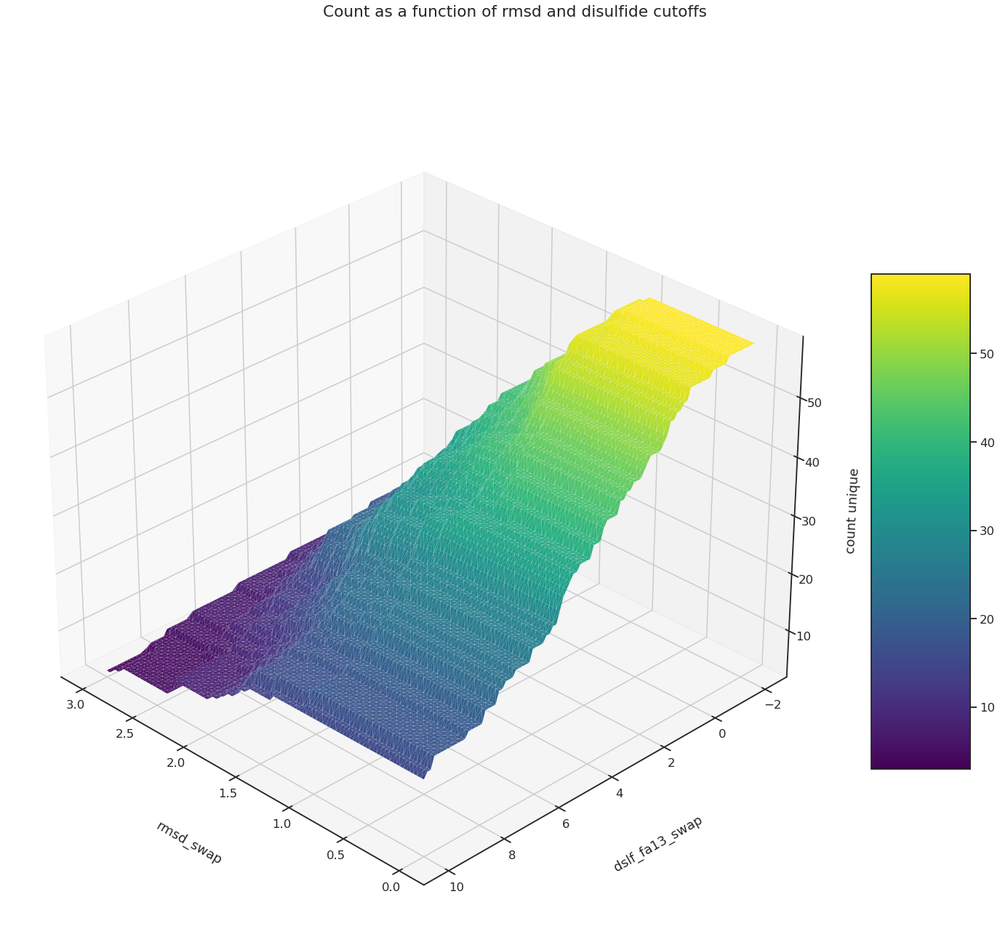

In [38]:
fig = plt.figure(figsize=(20, 20), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
ax.plot_trisurf(
    rmsds, dslfs, num, cmap=sns.color_palette("viridis", as_cmap=True), linewidth=0.1
)

ax.set_xlabel("rmsd_swap", labelpad=50)
ax.set_ylabel("dslf_fa13_swap", labelpad=50)
ax.set_zlabel("count unique", labelpad=25)
surf = ax.plot_trisurf(
    rmsds, dslfs, num, cmap=sns.color_palette("viridis", as_cmap=True), linewidth=0.1
)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.suptitle("Count as a function of rmsd and disulfide cutoffs")

# Rotate it
ax.view_init(30, 135)
plt.savefig(
    "figs/04_contour_swap_rmsd_dslf_cutoffs_vs_unique_parents_nonzero_shift.png"
)

### Save the designs that had the parent state disrupted sufficiently by the introduction of the staple

In [39]:
out_path = os.path.join(os.getcwd(), "04_pairs")
with open(os.path.join(out_path, "good_swap.list"), "w+") as f:
    for decoy in good_swap.index:
        print(decoy, file=f)

### Make pairs
Try to find a stapled reference parent first in `ref_df` aka `04_pack_staple_ref/scores.json` .  
If parent exists, and there are more than one stapled parent, find the parent with the lowest `dslf_fa13_cart`.  
If parent does not exist, try to find a stapled reference parent in `best_zero` .  
Again, if there are more than one stapled parent, find the parent with the lowest `dslf_fa13_cart`.  

In [40]:
print(ref_df.columns)
print(good_swap.columns)

Index(['9mer', 'closure_type', 'disulfide_at', 'dslf_fa13', 'dslf_fa13_cart',
       'fa_atr', 'fa_dun_dev', 'fa_dun_rot', 'fa_dun_semi', 'fa_elec',
       'fa_intra_atr_xover4', 'fa_intra_elec', 'fa_intra_rep_xover4',
       'fa_intra_sol_xover4', 'fa_rep', 'fa_sol', 'geometry', 'geometry_loop',
       'hbond_bb_sc', 'hbond_lr_bb', 'hbond_sc', 'hbond_sr_bb', 'hxl_tors',
       'lk_ball', 'lk_ball_bridge', 'lk_ball_bridge_uncpl', 'lk_ball_iso',
       'new_loop_resis', 'nmodes_attempts', 'omega', 'p_aa_pp', 'parent',
       'pre_break_helix', 'pro_close', 'rama_prepro', 'ref', 'rmsd_cart',
       'rmsd_dual', 'rmsd_nmp', 'total_length', 'total_score', 'stapled'],
      dtype='object')
Index(['9mer', 'abego_str', 'bb_clash', 'closure_type', 'cmsa_AB', 'cmsa_AC',
       'cmsa_BC', 'cmsa_int', 'disulfide_at', 'docked_helix', 'dslf_fa13',
       'dslf_fa13_cart', 'dslf_fa13_swap', 'dssp', 'fa_atr', 'fa_dun_dev',
       'fa_dun_rot', 'fa_dun_semi', 'fa_elec', 'fa_intra_atr_xover4',
       '

In [48]:
def parent2parent_basename(row):
    parent = row["parent"].replace(".pdb", "", 1)
    return parent


ref_df["parent"] = ref_df.apply(parent2parent_basename, axis=1)

In [50]:
closed_ref_df = ref_df[ref_df["disulfide_at"] != "0,0"]
total_matched = 0
total_not_matched = 0
matched_pairs = []
for state, scores in good_swap.iterrows():
    # check if in the reference states
    parent = scores["parent"]
    if parent in closed_ref_df.parent.values:
        subset = closed_ref_df[closed_ref_df["parent"] == parent]
    # check if in the zero shift states
    elif parent in best_zero.parent.values:
        subset = best_zero[best_zero["parent"] == parent]
    else:
        total_not_matched += 1
        continue
    # get the best disulfide score for state X (irrelevant if subset is only 1)
    if len(subset) > 1:
        subset = subset[subset.dslf_fa13_cart == subset.dslf_fa13_cart.min()]
    else:
        pass
    state_X_dict = subset.to_dict("index")
    state_Y_dict = {state: good_swap.loc[state].to_dict()}
    pair = state_X_dict, state_Y_dict
    matched_pairs.append(pair)
    total_matched += 1
print(f"No suitable parent available for {total_not_matched} designs")

No suitable parent available for 22 designs


### Save the absolute paths to state Y and state X
Split into parent subdirectories

In [51]:
list(matched_pairs[0][0].keys())[0]

'/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders/04_staple_ref/decoys/0000/2021.06.16.00.40.13.771912_1bacc0e26fdd433cb0627e37671208a7.pdb.bz2'

In [52]:
import binascii, time

output_path = os.path.join(os.getcwd(), "04_pairs/paired")

print(f"Dumping {str(len(matched_pairs))} pairs")

time.sleep(0.5)

for pair in tqdm(matched_pairs):
    Y_path = list(pair[1].keys())[0]
    X_path = list(pair[0].keys())[0]
    to_write = " ".join([Y_path, X_path])
    filename = str(binascii.b2a_hex(os.urandom(16)).decode("utf-8")) + ".pair"
    parent = pair[0][X_path]["parent"]
    fullpath = os.path.join(output_path, parent)
    os.makedirs(fullpath, exist_ok=True)
    file = os.path.join(fullpath, filename)
    with open(file, "w+") as f:
        print(to_write, file=f)

Dumping 887 pairs


100%|██████████| 887/887 [00:00<00:00, 1838.52it/s]


### Unused

In [ ]:
import pyrosetta
from pyrosetta.distributed import cluster
import pyrosetta.distributed.io as io

flags = """
-corrections::beta_nov16 true
-holes:dalphaball /home/bcov/ppi/tutorial_build/main/source/external/DAlpahBall/DAlphaBall.gcc
-indexed_structure_store:fragment_store /net/databases/VALL_clustered/connect_chains/ss_grouped_vall_helix_shortLoop.h5
-dunbrack_prob_buried 0.5
-dunbrack_prob_nonburied 0.5


-dunbrack_prob_buried_semi 0.5
-dunbrack_prob_nonburied_semi 0.5
"""
pyrosetta.distributed.init(" ".join(flags.replace("\n\t", " ").split()))
t = pack(
    None,
    **{
        "-s": "/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders/03_enumerate_loops/decoys/0002/2021.06.12.18.59.06.920858_3ec01bad5b8748769f7bd75e78f160f9.pdb.bz2",
    }
)
t = next(t)
t2 = staple(t)

In [ ]:
t3 = check_disulf_energy(*t2)
t4 = relax(t3)

In [7]:
def vcheck_disulf_energymeric_xyzVector_double_t__to__numpy_arr(ros_vec):
    return np.array([xyz for xyz in ros_vec])


def numpy_arr__to__vector1_numeric_xyzVector_double_t(np_arr):
    coords = pyrosetta.rosetta.utility.vector1_numeric_xyzVector_double_t()
    for xyz in np_arr:
        x, y, z = xyz
        coords.append(pyrosetta.rosetta.numeric.xyzVector_double_t(x_a=x, y_a=y, z_a=z))
    return coords


def get_ids_and_coords(pose):
    ids = pyrosetta.rosetta.utility.vector1_core_id_AtomID()
    for i, res in enumerate(pose.residues):
        ros_i = i + 1
        for j in range(1, res.natoms() + 1):
            ids.append(pyrosetta.AtomID(j, ros_i))
    coords = pyrosetta.rosetta.utility.vector1_numeric_xyzVector_double_t()
    pose.batch_get_xyz(ids, coords)
    coords = vector1_numeric_xyzVector_double_t__to__numpy_arr(coords)
    return ids, coords


def set_coords(pose, ids, coords):
    coords = numpy_arr__to__vector1_numeric_xyzVector_double_t(coords)
    pose.batch_set_xyz(ids, coords)


pose = io.to_pose(t)

ids, coords = get_ids_and_coords(pose)

offset = np.random.randint(-9, 9, size=(len(coords), 3))

coords += offset / 1000

set_coords(pose, ids, coords)


In [ ]:
t2 = staple(io.to_packed(pose))

In [10]:
for i, ppose in enumerate(t2):
    ppose.pose.dump_pdb(f"{i}.pdb")

In [28]:
for_cullen = best_nozero[best_nozero["scaffold"] != "THR"]
len(for_cullen)

835

In [30]:
out_path = "/mnt/home/pleung/for/cdemakis/20210914"
with open(os.path.join(out_path, "no_THR_state_Y.list"), "w+") as f:
    for decoy in for_cullen.index:
        print(decoy, file=f)